In [1]:
#Data set downloaded rom: https://statweb.stanford.edu/~sabatti/data.html
# Challenge description by the author:

#Computer Network Traffic Data - A ~500K CSV with summary of some real network traffic data from the past. 
#The dataset has ~21K rows and covers 10 local workstation IPs over a three month period. 
#Half of these local IPs were compromised at some point during this period and became members of various botnets. 
#Can you discover when a compromise has occurred by a change in the pattern of communication?

#Each row consists of four columns:
#date: yyyy-mm-dd (from 2006-07-01 through 2006-09-30)
#l_ipn: local IP (coded as an integer from 0-9)
#r_asn: remote ASN (an integer which identifies the remote ISP)
#f: flows (count of connnections for that day)
#Reports of "odd" activity or suspicions about a machine's behavior triggered investigations on the following days (although the machine might have been compromised earlier)
#Date : IP
#08-24 : 1
#09-04 : 5
#09-18 : 4
#09-26 : 3 6

In [1]:
#My approach to tackle the challenge:
#Botnet forensics usually employs all data possible from network traffic captures, to would allow the investigator to
#achieve several levels of classification to help zero down to the infected computers, used ports, and used services during attacks.

#Due to the limited data offered by the data set of posted challenge; and honoring the statement that 
#..."Half of these local IPs were compromised at some point during this period and became members of various botnets."
#I am willing to demonstrate that applying flow correlation may help me detect what computers were infested and some details about
#the butnets attacks that took place.


In [2]:
import numpy
import pandas
import io #This is for pandas.io.formats.style.Styler
import requests
import matplotlib.pyplot as plot #library for plotting of time series.
import seaborn #library for correlation matrix.
from pandas import to_datetime
pandas.set_option('display.max_rows', 20000)

In [3]:
#df = pandas.read_csv('dataset1a.csv') #Reading data set downloaded from 'https://statweb.stanford.edu/~sabatti/data.html', name: 'Computer Network Traffic Data'.
url="http://hci.stanford.edu/courses/cs448b/data/ipasn/cs448b_ipasn.csv"
s=requests.get(url).content
df=pandas.read_csv(io.StringIO(s.decode('utf-8')))

In [4]:
# _1 Exploring / Understanding the Data Set's features:

In [5]:
print(df.head(30)) #Exploring: inspecting data set.



          date  l_ipn  r_asn   f
0   2006-07-01      0    701   1
1   2006-07-01      0    714   1
2   2006-07-01      0   1239   1
3   2006-07-01      0   1680   1
4   2006-07-01      0   2514   1
5   2006-07-01      0   3320   1
6   2006-07-01      0   3561  13
7   2006-07-01      0   4134   3
8   2006-07-01      0   5617   2
9   2006-07-01      0   6478   1
10  2006-07-01      0   6713   1
11  2006-07-01      0   7132   1
12  2006-07-01      0   9105   1
13  2006-07-01      0  10738   1
14  2006-07-01      0  10994   1
15  2006-07-01      0  12334   1
16  2006-07-01      0  12524   1
17  2006-07-01      0  12542   1
18  2006-07-01      0  13343   1
19  2006-07-01      0  13446   1
20  2006-07-01      0  13462  20
21  2006-07-01      0  13867   1
22  2006-07-01      0  13989   1
23  2006-07-01      0  14501  37
24  2006-07-01      0  16755   1
25  2006-07-01      0  17228   1
26  2006-07-01      0  19262   1
27  2006-07-01      0  19444   1
28  2006-07-01      0  20258   1
29  2006-0

In [6]:
print('Data Frame shape (rows,cols): {} '.format(df.shape)) #Exploring: Querying shape of the data set.

Data Frame shape (rows,cols): (20803, 4) 


In [7]:
df.describe() #Exploring: querying basic data set statistics.

,l_ipn,r_asn,f
count,20803.000000,20803.000000,20803.000000
mean,4.228236,12138.320338,93.914243
std,3.278183,9766.324252,5764.995269
min,0.000000,3.000000,1.000000
25%,1.000000,4323.000000,1.000000
50%,4.000000,8764.000000,2.000000
75%,7.000000,17676.000000,8.000000
max,9.000000,40092.000000,784234.000000


In [8]:
type(df) #Exploring: confirming it's a dataFrame, not a list, array or series.

pandas.core.frame.DataFrame

In [9]:
df.info() #Exploring: checking data set feature sizes.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20803 entries, 0 to 20802
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   date    20803 non-null  object
 1   l_ipn   20803 non-null  int64 
 2   r_asn   20803 non-null  int64 
 3   f       20803 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 650.2+ KB


In [10]:
#Exploring: printing a report with data facts.
print('Time period data available (days) {:d}'.format(df['date'].nunique()))
print('Number of Computers (ipn) {:d}'.format(df['l_ipn'].nunique()))
print('Number of remote servers (ASN) {:d}'.format(df['r_asn'].nunique()))
print('Minimum connections count per day {:d}'.format(df['f'].min()))
print('Maximum connections count per day {:d}'.format(df['f'].max()))
print('Missing or NAN values in dataset {:d}', df.isnull().sum())

Time period data available (days) 92
Number of Computers (ipn) 10
Number of remote servers (ASN) 2005
Minimum connections count per day 1
Maximum connections count per day 784234
Missing or NAN values in dataset {:d} date     0
l_ipn    0
r_asn    0
f        0
dtype: int64


In [11]:
top=df['r_asn'].value_counts().nlargest(100) #Exploring: querying the top-most contacted servers and their total count.
top_df=pandas.DataFrame(top)
top_df


,r_asn
3561,483
4134,412
7132,367
2152,344
15169,327
8070,302
8075,283
4837,244
209,235
4323,203


In [12]:
#Generating: a variable for each computer to store their aggregate flows for use in the time series graphs.
Computer1 = df.loc[df["l_ipn"] == 0]
Computer2 = df.loc[df["l_ipn"] == 1]
Computer3 = df.loc[df["l_ipn"] == 2]
Computer4 = df.loc[df["l_ipn"] == 3]
Computer5 = df.loc[df["l_ipn"] == 4]
Computer6 = df.loc[df["l_ipn"] == 5]
Computer7 = df.loc[df["l_ipn"] == 6]
Computer8 = df.loc[df["l_ipn"] == 7]
Computer9 = df.loc[df["l_ipn"] == 8]
Computer10 = df.loc[df["l_ipn"] == 9]
type(Computer1) #test
Computer1.loc[Computer1['r_asn']==13462].sum()


date     2006-07-012006-07-022006-07-032006-07-042006-0...
l_ipn                                                    0
r_asn                                              1238504
f                                                     2744
dtype: object

In [13]:
#Generating daily flow aggregates of all computers...and then for each computer then querying basic stats (for the plots).
daily_aggregate_flow = df.groupby(['date'])[['f']].sum() #Daily aggregate of all traffic
daily_aggregate_flow.reset_index(inplace = True)

daily_aggregate_flow1 = Computer1.groupby(['date'])[['f']].sum()
daily_aggregate_flow1.reset_index(inplace = True)
daily_aggregate_flow1 = daily_aggregate_flow1.rename(columns={'f':'flows_C#1'})

daily_aggregate_flow2 = Computer2.groupby(['date'])[['f']].sum()
daily_aggregate_flow2.reset_index(inplace = True)
daily_aggregate_flow2 = daily_aggregate_flow2.rename(columns={'f':'flows_C#2'})

daily_aggregate_flow3 = Computer3.groupby(['date'])[['f']].sum()
daily_aggregate_flow3.reset_index(inplace = True)
daily_aggregate_flow3 = daily_aggregate_flow3.rename(columns={'f':'flows_C#3'})

daily_aggregate_flow4 = Computer4.groupby(['date'])[['f']].sum()
daily_aggregate_flow4.reset_index(inplace = True)
daily_aggregate_flow4 = daily_aggregate_flow4.rename(columns={'f':'flows_C#4'})

daily_aggregate_flow5 = Computer5.groupby(['date'])[['f']].sum()
daily_aggregate_flow5.reset_index(inplace = True)
daily_aggregate_flow5 = daily_aggregate_flow5.rename(columns={'f':'flows_C#5'})

daily_aggregate_flow6 = Computer6.groupby(['date'])[['f']].sum()
daily_aggregate_flow6.reset_index(inplace = True)
daily_aggregate_flow6 = daily_aggregate_flow6.rename(columns={'f':'flows_C#6'})

daily_aggregate_flow7 = Computer7.groupby(['date'])[['f']].sum()
daily_aggregate_flow7.reset_index(inplace = True)
daily_aggregate_flow7 = daily_aggregate_flow7.rename(columns={'f':'flows_C#7'})

daily_aggregate_flow8 = Computer8.groupby(['date'])[['f']].sum()
daily_aggregate_flow8.reset_index(inplace = True)
daily_aggregate_flow8 = daily_aggregate_flow8.rename(columns={'f':'flows_C#8'})

daily_aggregate_flow9 = Computer9.groupby(['date'])[['f']].sum()
daily_aggregate_flow9.reset_index(inplace = True)
daily_aggregate_flow9 = daily_aggregate_flow9.rename(columns={'f':'flows_C#9'})

daily_aggregate_flow10 = Computer10.groupby(['date'])[['f']].sum()
daily_aggregate_flow10.reset_index(inplace = True)
daily_aggregate_flow10 = daily_aggregate_flow10.rename(columns={'f':'flows_C#10'})

#daily_aggregate_flow of all Computers
daily_aggregate_flow['f'].head(5)


0     5058
1     7437
2     7248
3     8280
4    27189
Name: f, dtype: int64

In [14]:
#Generating a daily mean of flows for use in the time series graph.
daily_mean = round(daily_aggregate_flow['f'].mean(),6)

#daily_mean1 = round(daily_aggregate_flow1['flows_C#1'].mean(),6)
print(daily_mean1)
#daily_mean2 = round(daily_aggregate_flow2['flows_C#2'].mean(),6)
#daily_mean3 = round(daily_aggregate_flow3['flows_C#3'].mean(),6)
#daily_mean4 = round(daily_aggregate_flow4['flows_C#4'].mean(),6)
#daily_mean5 = round(daily_aggregate_flow5['flows_C#5'].mean(),6)
#daily_mean6 = round(daily_aggregate_flow6['flows_C#6'].mean(),6)
#daily_mean7 = round(daily_aggregate_flow7['flows_C#7'].mean(),6)
#daily_mean8 = round(daily_aggregate_flow8['flows_C#8'].mean(),6)
#daily_mean9 = round(daily_aggregate_flow9['flows_C#9'].mean(),6)
#daily_mean10 = round(daily_aggregate_flow10['flows_C#10'].mean(),6)



NameError: name 'daily_mean1' is not defined

In [15]:
#Generating a dictionary with the info posted with the data set challenge about suspected attack dates.
dictionary = {'2006-08-24':1,'2006-09-04':5,'2006-09-18':4,'2006-09-26':3}
marked_anom = pandas.DataFrame.from_dict(dictionary,orient='index')
marked_anom.reset_index(inplace = True)
marked_anom.columns = ['date','l_ipn']
print(marked_anom)

         date  l_ipn
0  2006-08-24      1
1  2006-09-04      5
2  2006-09-18      4
3  2006-09-26      3


In [16]:
#Exploring: checking for suspected attack on servers from suspected compromised computers on suspicious activity dates.
#NOTE: found no repeats. Compputer flow correlation may not be strong on those days. Pattern?
Suspicion1_Comp1= Computer1.loc[Computer1['date']=='2006-08-24']
susp1=(Suspicion1_Comp1['r_asn'].value_counts()[:100].index.tolist())
Suspicion2_Comp5= Computer5.loc[Computer5['date']=='2006-09-04']
susp2=(Suspicion2_Comp5['r_asn'].value_counts()[:100].index.tolist())
Suspicion3_Comp4= Computer4.loc[Computer4['date']=='2006-09-18']
susp3=(Suspicion3_Comp4['r_asn'].value_counts()[:100].index.tolist())
Suspicion4_Comp3= Computer3.loc[Computer3['date']=='2006-09-26']
susp4=(Suspicion4_Comp3['r_asn'].value_counts()[:100].index.tolist())
Suspicion5_Comp6= Computer6.loc[Computer6['date']=='2006-09-26']
susp5=(Suspicion5_Comp6['r_asn'].value_counts()[:100].index.tolist())

Suspicious_Comp_Activity = pandas.DataFrame.from_dict(
    {'Susp1_Comp1':susp1,
     'Susp2_Comp5':susp2,
     'Susp3_Comp4':susp3,
     'Susp4_Comp3':susp4,
     'Susp5_Comp6':susp5}, orient='index')

Suspicious_Comp_Activity.transpose().fillna(0).astype(int)

,Susp1_Comp1,Susp2_Comp5,Susp3_Comp4,Susp4_Comp3,Susp5_Comp6
0,209,1668,1239,174,0
1,701,3320,5413,8422,0
2,9121,4134,5617,33650,0
3,10091,4837,6517,30099,0
4,10838,6356,9316,29863,0
5,11172,6428,9800,29096,0
6,11486,7482,13749,19918,0
7,12479,8001,15087,19742,0
8,13343,9371,16131,19548,0
9,13462,29895,16339,18530,0


In [ ]:
# _2 Calculating and Visualizing Aggregate Flows (number of connections by each l_ipn computer)

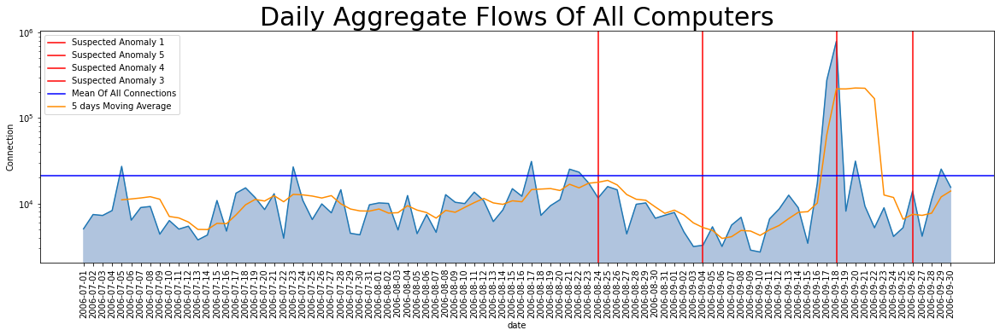

In [19]:
#Plotting the Daily Aggregate Flows of all Computers during the 92 day observation period.
plot.figure(figsize=(20,5))
plot.plot(daily_aggregate_flow['date'],daily_aggregate_flow['f'])
[plot.axvline(x=_x, color='r' , label = 'Suspected Anomaly {}'.format(ip)) for _x,ip in list(marked_anom[['date','l_ipn']].to_records(index=False))]
plot.axhline(y= daily_mean, color='b', label = 'Mean Of All Connections')
plot.plot(daily_aggregate_flow['date'],daily_aggregate_flow['f'].rolling(5).mean(), color='darkorange', label = '5 days Moving Average')
plot.xticks(daily_aggregate_flow['date'][::1],  rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Daily Aggregate Flows Of All Computers',fontsize=30,ha='center')
plot.fill_between(daily_aggregate_flow['date'],daily_aggregate_flow['f'],color='lightsteelblue')
plot.legend()
plot.show()

1143.228261


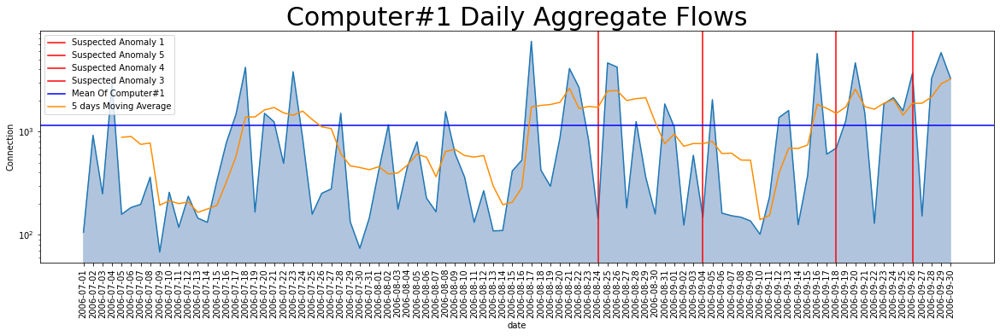

In [20]:
#Plotting the Daily Aggregate Flows of Computer#1 during the 92 day observation period.
daily_mean1 = round(daily_aggregate_flow1['flows_C#1'].mean(),6)
print (daily_mean1)
plot.figure(figsize=(20,5))
plot.plot(daily_aggregate_flow1['date'],daily_aggregate_flow1['flows_C#1'])
[plot.axvline(x=_x, color='r' , label = 'Suspected Anomaly {}'.format(ip)) for _x,ip in list(marked_anom[['date','l_ipn']].to_records(index=False))]
plot.axhline(y= daily_mean1, color='b', label = 'Mean Of Computer#1')
plot.plot(daily_aggregate_flow1['date'],daily_aggregate_flow1['flows_C#1'].rolling(5).mean(), color='darkorange', label = '5 days Moving Average')
plot.xticks(daily_aggregate_flow1['date'][::1],  rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Computer#1 Daily Aggregate Flows',fontsize=30,ha='center')
plot.fill_between(daily_aggregate_flow1['date'],daily_aggregate_flow1['flows_C#1'],color='lightsteelblue')
plot.legend()
plot.show()

3494.482143


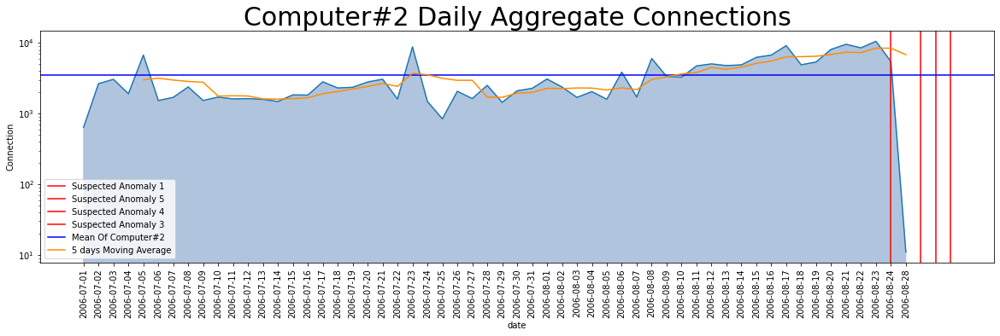

In [21]:
#Plotting the Daily Aggregate Flows of Computer#2 during the 92 day observation period.
daily_mean2 = round(daily_aggregate_flow2['flows_C#2'].mean(),6)
print (daily_mean2)

plot.figure(figsize=(20,5))
plot.plot(daily_aggregate_flow2['date'],daily_aggregate_flow2['flows_C#2'])
[plot.axvline(x=_x, color='r' , label = 'Suspected Anomaly {}'.format(ip)) for _x,ip in list(marked_anom[['date','l_ipn']].to_records(index=False))]
plot.axhline(y= daily_mean2, color='b', label = 'Mean Of Computer#2')
plot.plot(daily_aggregate_flow2['date'],daily_aggregate_flow2['flows_C#2'].rolling(5).mean(), color='darkorange', label = '5 days Moving Average')
plot.xticks(daily_aggregate_flow2['date'][::1],  rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Computer#2 Daily Aggregate Flows',fontsize=30,ha='center')
plot.fill_between(daily_aggregate_flow2['date'],daily_aggregate_flow2['flows_C#2'],color='lightsteelblue')
plot.legend()
plot.show()

2127.315217


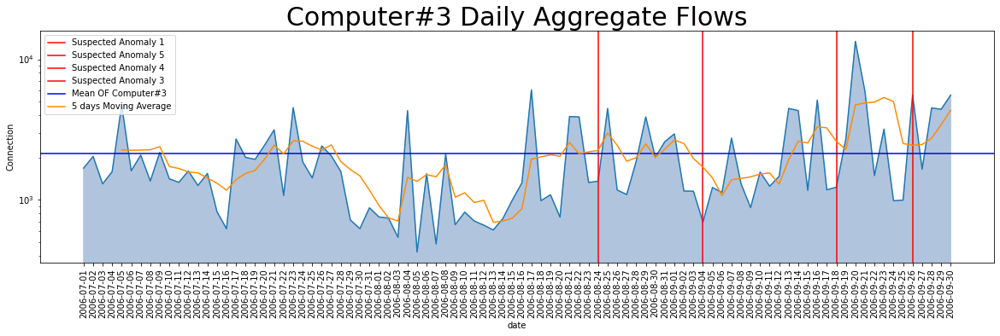

In [22]:
#Plotting the Daily Aggregate Flows of Computer#3 during the 92 day observation period.
daily_mean3 = round(daily_aggregate_flow3['flows_C#3'].mean(),6)
print (daily_mean3)

plot.figure(figsize=(20,5))
plot.plot(daily_aggregate_flow3['date'],daily_aggregate_flow3['flows_C#3'])
[plot.axvline(x=_x, color='r' , label = 'Suspected Anomaly {}'.format(ip)) for _x,ip in list(marked_anom[['date','l_ipn']].to_records(index=False))]
plot.axhline(y= daily_mean3, color='b', label = 'Mean OF Computer#3')
plot.plot(daily_aggregate_flow3['date'],daily_aggregate_flow3['flows_C#3'].rolling(5).mean(), color='darkorange', label = '5 days Moving Average')
plot.xticks(daily_aggregate_flow3['date'][::1],  rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Computer#3 Daily Aggregate Flows',fontsize=30,ha='center')
plot.fill_between(daily_aggregate_flow3['date'],daily_aggregate_flow3['flows_C#3'],color='lightsteelblue')
plot.legend()
plot.show()

55.101124


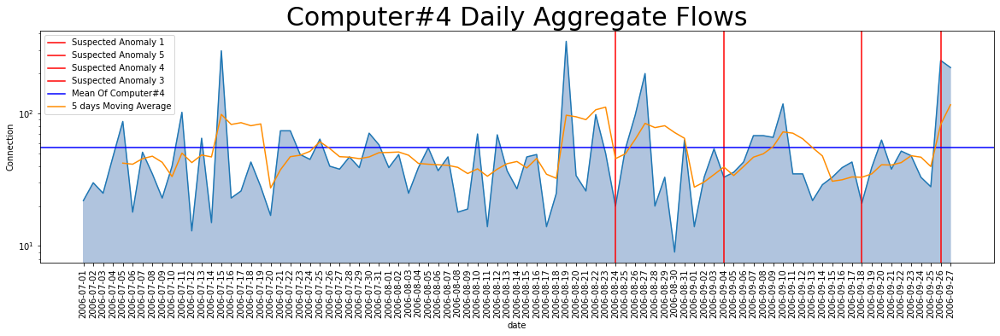

In [23]:
#Plotting the Daily Aggregate Flows of Computer#4 during the 92 day observation period.
daily_mean4 = round(daily_aggregate_flow4['flows_C#4'].mean(),6)
print (daily_mean4)

plot.figure(figsize=(20,5))
plot.plot(daily_aggregate_flow4['date'],daily_aggregate_flow4['flows_C#4'])
[plot.axvline(x=_x, color='r' , label = 'Suspected Anomaly {}'.format(ip)) for _x,ip in list(marked_anom[['date','l_ipn']].to_records(index=False))]
plot.axhline(y= daily_mean4, color='b', label = 'Mean Of Computer#4')
plot.plot(daily_aggregate_flow4['date'],daily_aggregate_flow4['flows_C#4'].rolling(5).mean(), color='darkorange', label = '5 days Moving Average')
plot.xticks(daily_aggregate_flow4['date'][::1],  rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Computer#4 Daily Aggregate Flows',fontsize=30,ha='center')
plot.fill_between(daily_aggregate_flow4['date'],daily_aggregate_flow4['flows_C#4'],color='lightsteelblue')
plot.legend()
plot.show()

13667.639535


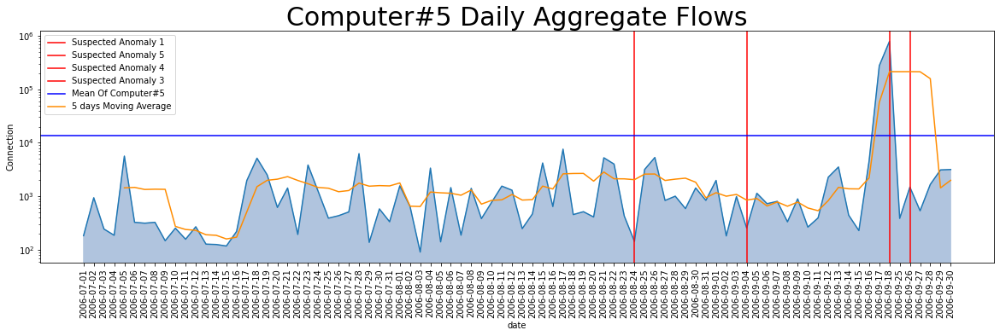

In [24]:
#Plotting the Daily Aggregate Flows of Computer#5 during the 92 day observation period.
daily_mean5 = round(daily_aggregate_flow5['flows_C#5'].mean(),6)
print (daily_mean5)

plot.figure(figsize=(20,5))
plot.plot(daily_aggregate_flow5['date'],daily_aggregate_flow5['flows_C#5'])
[plot.axvline(x=_x, color='r' , label = 'Suspected Anomaly {}'.format(ip)) for _x,ip in list(marked_anom[['date','l_ipn']].to_records(index=False))]
plot.axhline(y= daily_mean5, color='b', label = 'Mean Of Computer#5')
plot.plot(daily_aggregate_flow5['date'],daily_aggregate_flow5['flows_C#5'].rolling(5).mean(), color='darkorange', label = '5 days Moving Average')
plot.xticks(daily_aggregate_flow5['date'][::1],  rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Computer#5 Daily Aggregate Flows',fontsize=30,ha='center')
plot.fill_between(daily_aggregate_flow5['date'],daily_aggregate_flow5['flows_C#5'],color='lightsteelblue')
plot.legend()
plot.show()

86.268657


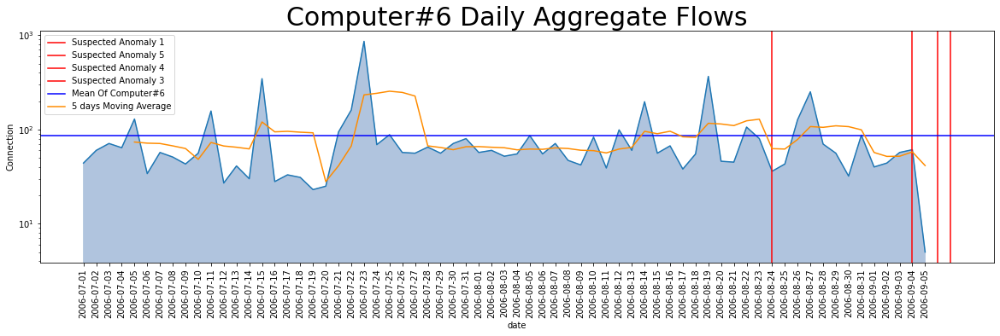

In [25]:
#Plotting the Daily Aggregate Flows of Computer#6 during the 92 day observation period.
daily_mean_flow6 = round(daily_aggregate_flow6['flows_C#6'].mean(),6)
print (daily_mean_flow6)

plot.figure(figsize=(20,5))
plot.plot(daily_aggregate_flow6['date'],daily_aggregate_flow6['flows_C#6'])
[plot.axvline(x=_x, color='r' , label = 'Suspected Anomaly {}'.format(ip)) for _x,ip in list(marked_anom[['date','l_ipn']].to_records(index=False))]
plot.axhline(y= daily_mean_flow6, color='b', label = 'Mean Of Computer#6')
plot.plot(daily_aggregate_flow6['date'],daily_aggregate_flow6['flows_C#6'].rolling(5).mean(), color='darkorange', label = '5 days Moving Average')
plot.xticks(daily_aggregate_flow6['date'][::1],  rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Computer#6 Daily Aggregate Flows',fontsize=30,ha='center')
plot.fill_between(daily_aggregate_flow6['date'],daily_aggregate_flow6['flows_C#6'],color='lightsteelblue')
plot.legend()
plot.show()

74.988764


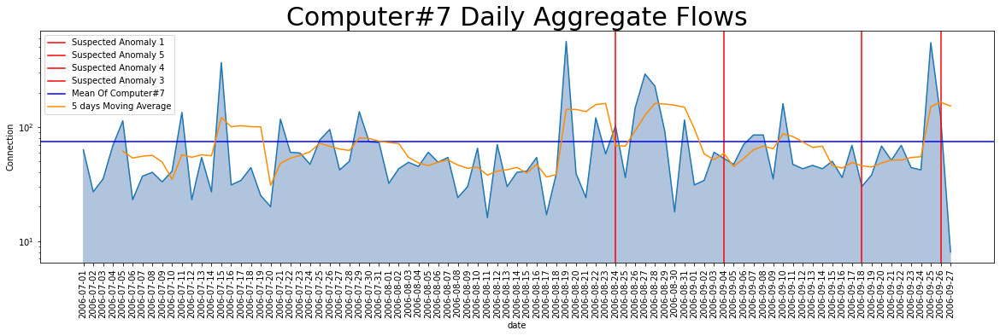

In [26]:
#Plotting the Daily Aggregate Flows of Computer#7 during the 92 day observation period.
daily_mean7 = round(daily_aggregate_flow7['flows_C#7'].mean(),6)
print (daily_mean7)
plot.figure(figsize=(20,5))
plot.plot(daily_aggregate_flow7['date'],daily_aggregate_flow7['flows_C#7'])
[plot.axvline(x=_x, color='r' , label = 'Suspected Anomaly {}'.format(ip)) for _x,ip in list(marked_anom[['date','l_ipn']].to_records(index=False))]
plot.axhline(y= daily_mean7, color='b', label = 'Mean Of Computer#7')
plot.plot(daily_aggregate_flow7['date'],daily_aggregate_flow7['flows_C#7'].rolling(5).mean(), color='darkorange', label = '5 days Moving Average')
plot.xticks(daily_aggregate_flow7['date'][::1],  rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Computer#7 Daily Aggregate Flows',fontsize=30,ha='center')
plot.fill_between(daily_aggregate_flow7['date'],daily_aggregate_flow7['flows_C#7'],color='lightsteelblue')
plot.legend()
plot.show()

384.369565


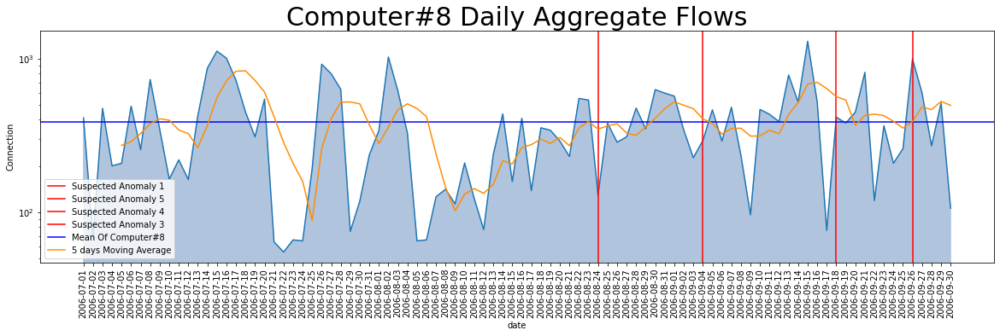

In [27]:
#Plotting the Daily Aggregate Flows of Computer#8 during the 92 day observation period.
daily_mean8 = round(daily_aggregate_flow8['flows_C#8'].mean(),6)
print (daily_mean8)
plot.figure(figsize=(20,5))
plot.plot(daily_aggregate_flow8['date'],daily_aggregate_flow8['flows_C#8'])
[plot.axvline(x=_x, color='r' , label = 'Suspected Anomaly {}'.format(ip)) for _x,ip in list(marked_anom[['date','l_ipn']].to_records(index=False))]
plot.axhline(y= daily_mean8, color='b', label = 'Mean Of Computer#8')
plot.plot(daily_aggregate_flow8['date'],daily_aggregate_flow8['flows_C#8'].rolling(5).mean(), color='darkorange', label = '5 days Moving Average')
plot.xticks(daily_aggregate_flow8['date'][::1],  rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Computer#8 Daily Aggregate Flows',fontsize=30,ha='center')
plot.fill_between(daily_aggregate_flow8['date'],daily_aggregate_flow8['flows_C#8'],color='lightsteelblue')
plot.legend()
plot.show()

1306.554348


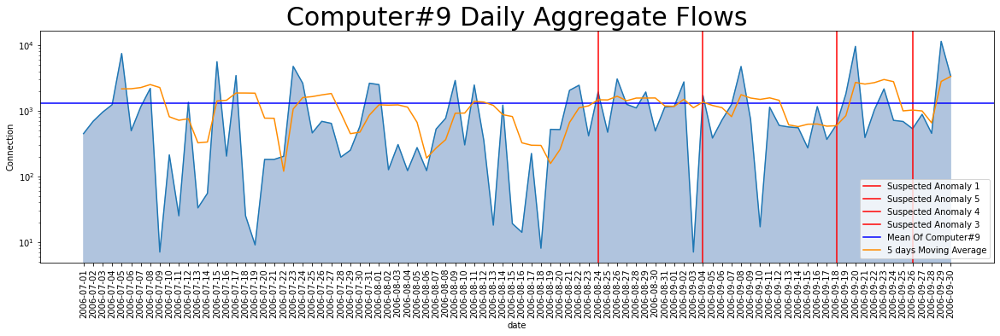

In [28]:
#Plotting the Daily Aggregate Flows of Computer#9 during the 92 day observation period.
daily_mean9 = round(daily_aggregate_flow9['flows_C#9'].mean(),6)
print (daily_mean9)

plot.figure(figsize=(20,5))
plot.plot(daily_aggregate_flow9['date'],daily_aggregate_flow9['flows_C#9'])
[plot.axvline(x=_x, color='r' , label = 'Suspected Anomaly {}'.format(ip)) for _x,ip in list(marked_anom[['date','l_ipn']].to_records(index=False))]
plot.axhline(y= daily_mean9, color='b', label = 'Mean Of Computer#9')
plot.plot(daily_aggregate_flow9['date'],daily_aggregate_flow9['flows_C#9'].rolling(5).mean(), color='darkorange', label = '5 days Moving Average')
plot.xticks(daily_aggregate_flow9['date'][::1],  rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Computer#9 Daily Aggregate Flows',fontsize=30,ha='center')
plot.fill_between(daily_aggregate_flow9['date'],daily_aggregate_flow9['flows_C#9'],color='lightsteelblue')
plot.legend()
plot.show()

1182.358696


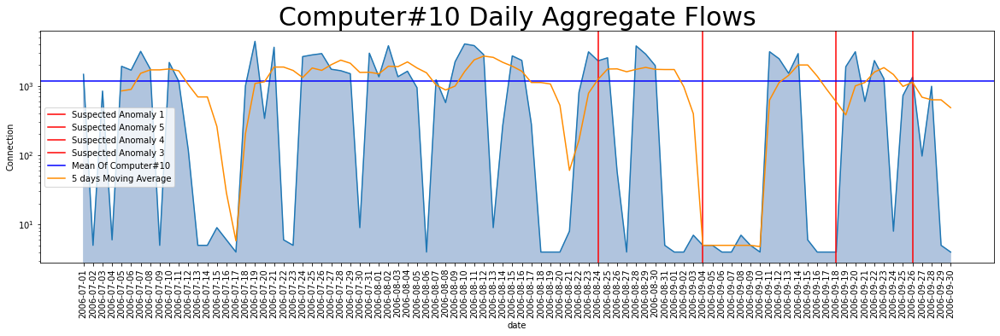

In [29]:
#Plotting the Daily Aggregate Flows of Computer#10 during the 92 day observation period.
daily_mean10 = round(daily_aggregate_flow10['flows_C#10'].mean(),6)
print (daily_mean10)
plot.figure(figsize=(20,5))
plot.plot(daily_aggregate_flow10['date'],daily_aggregate_flow10['flows_C#10'])
[plot.axvline(x=_x, color='r' , label = 'Suspected Anomaly {}'.format(ip)) for _x,ip in list(marked_anom[['date','l_ipn']].to_records(index=False))]
plot.axhline(y= daily_mean10, color='b', label = 'Mean Of Computer#10')
plot.plot(daily_aggregate_flow10['date'],daily_aggregate_flow10['flows_C#10'].rolling(5).mean(), color='darkorange', label = '5 days Moving Average')
plot.xticks(daily_aggregate_flow10['date'][::1],  rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Computer#10 Daily Aggregate Flows',fontsize=30,ha='center')
plot.fill_between(daily_aggregate_flow10['date'],daily_aggregate_flow10['flows_C#10'],color='lightsteelblue')
plot.legend()
plot.show()

In [30]:
#Test: report to corroborate daily aggregate flows of two computers with correlated flow(to verify plot).
testComputerIndexed_a = Computer1.set_index('date')
flow_testComputer_a = testComputerIndexed_a['f'].groupby('date').sum()
flow_a = pandas.DataFrame(numpy.array(flow_testComputer_a), columns=['f'])
flow_a.columns = ['fa']
type(flow_a)


testComputerIndexed_b = Computer3.set_index('date')
flow_testComputer_b = testComputerIndexed_b['f'].groupby('date').sum()
flow_b = pandas.DataFrame(numpy.array(flow_testComputer_b), columns=['f'])
flow_b.columns = ['fb']
flow_b

flow_a['fb']=flow_b
flow_a

,fa,fb
0,106,1677
1,920,2036
2,249,1296
3,2971,1584
4,158,4725
5,184,1606
6,197,2077
7,361,1359
8,68,2170
9,258,1408


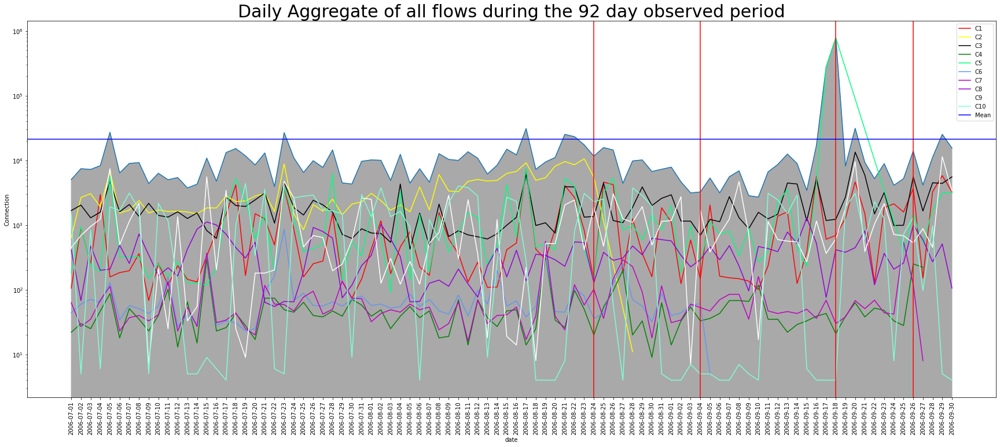

In [31]:
#Plotting all flows of daily aggregate conenctions.
plot.figure(figsize=(30,12))
plot.plot(daily_aggregate_flow['date'],daily_aggregate_flow['f'])
plot.plot(daily_aggregate_flow1['date'],daily_aggregate_flow1['flows_C#1'], color= 'r', label='C1')
plot.plot(daily_aggregate_flow2['date'],daily_aggregate_flow2['flows_C#2'], color= 'yellow', label='C2')
plot.plot(daily_aggregate_flow3['date'],daily_aggregate_flow3['flows_C#3'], color= 'black', label='C3')
plot.plot(daily_aggregate_flow4['date'],daily_aggregate_flow4['flows_C#4'], color= 'green', label='C4')
plot.plot(daily_aggregate_flow5['date'],daily_aggregate_flow5['flows_C#5'], color= 'springgreen', label='C5')
plot.plot(daily_aggregate_flow6['date'],daily_aggregate_flow6['flows_C#6'], color= 'cornflowerblue', label='C6')
plot.plot(daily_aggregate_flow7['date'],daily_aggregate_flow7['flows_C#7'], color= 'm', label='C7')
plot.plot(daily_aggregate_flow8['date'],daily_aggregate_flow8['flows_C#8'], color= 'darkviolet', label='C8')
plot.plot(daily_aggregate_flow9['date'],daily_aggregate_flow9['flows_C#9'], color= 'white', label='C9')
plot.plot(daily_aggregate_flow10['date'],daily_aggregate_flow10['flows_C#10'], color= 'aquamarine', label='C10')
[plot.axvline(x=_x, color='r') for _x,ip in list(marked_anom[['date','l_ipn']].to_records(index=False))]
plot.axhline(y= daily_mean, color='b', label = 'Mean')
#plot.plot(daily_aggregate['date'],daily_aggregate['f'].rolling(5).mean(), color='darkorange', label = '5 days Moving Average')
plot.xticks(daily_aggregate_flow['date'][::1],  rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Daily Aggregate of all flows during the 92 day observed period',fontsize=30,ha='center')
plot.fill_between(daily_aggregate_flow['date'],daily_aggregate_flow['f'],color='darkgray')
plot.legend()
plot.show()

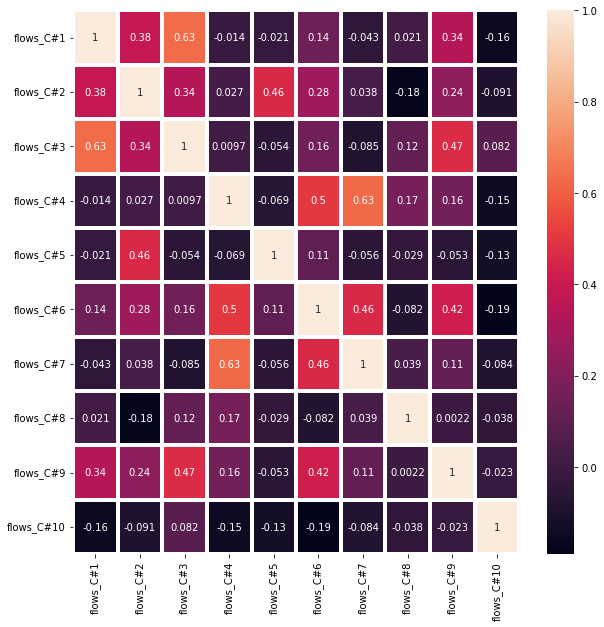

In [32]:
### Plotting a correlation matrix of all computer's daily aggregate flows.
corrMatrix = pandas.concat([daily_aggregate_flow1['flows_C#1'], daily_aggregate_flow2['flows_C#2'], daily_aggregate_flow3['flows_C#3'], daily_aggregate_flow4['flows_C#4'], daily_aggregate_flow5['flows_C#5'], daily_aggregate_flow6['flows_C#6'], daily_aggregate_flow7['flows_C#7'], daily_aggregate_flow8['flows_C#8'], daily_aggregate_flow9['flows_C#9'], daily_aggregate_flow10['flows_C#10']], axis=1).corr()
plot.subplots(figsize=(10,10))
seaborn.heatmap(corrMatrix.iloc[:, 0:10:], annot=True, linewidths=4)
plot.show()

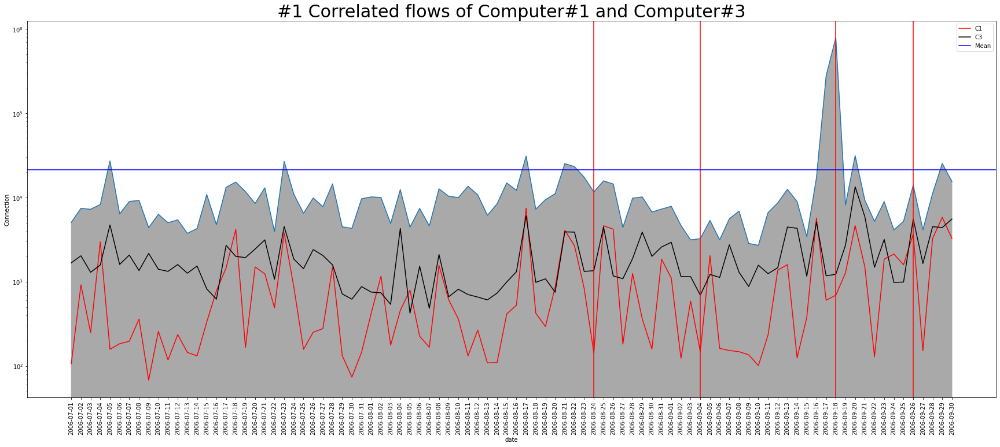

In [33]:
#1 Visualizing: activity of the flow correlated Computer#1 and Computer#3.
plot.figure(figsize=(30,12))
plot.plot(daily_aggregate_flow['date'],daily_aggregate_flow['f'])
plot.plot(daily_aggregate_flow1['date'],daily_aggregate_flow1['flows_C#1'], color= 'r', label='C1')
#plot.plot(daily_aggregate_flow2['date'],daily_aggregatee_flow2['flows_C#2'], color= 'yellow', label='C2')
plot.plot(daily_aggregate_flow3['date'],daily_aggregate_flow3['flows_C#3'], color= 'black', label='C3')
#plot.plot(daily_aggregate_flow4['date'],daily_aggregate_flow4['flows_C#4'], color= 'green', label='C4')
#plot.plot(daily_aggregate_flow5['date'],daily_aggregate_flow5['flows_C#5'], color= 'springgreen', label='C5')
#plot.plot(daily_aggregate_flow6['date'],daily_aggregate_flow6['flows_C#6'], color= 'midnightblue', label='C6')
#plot.plot(daily_aggregate_flow7['date'],daily_aggregate_flow7['flows_C#7'], color= 'm', label='C7')
#plot.plot(daily_aggregate_flow8['date'],daily_aggregate_flow8['flows_C#8'], color= 'darkviolet', label='C8')
#plot.plot(daily_aggregate_flow9['date'],daily_aggregate_flow9['flows_C#9'], color= 'firebrick', label='C9')
#plot.plot(daily_aggregate_flow10['date'],daily_aggregate_flow10['flows_C#10'], color= 'white', label='C10')
[plot.axvline(x=_x, color='r') for _x,ip in list(marked_anom[['date','l_ipn']].to_records(index=False))]
plot.axhline(y= daily_mean, color='b', label = 'Mean')
#plot.plot(daily_aggregate_flow['date'],daily_aggregate_flow['f'].rolling(5).mean(), color='darkorange', label = '5 days Moving Average')
plot.xticks(daily_aggregate_flow['date'][::1],  rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('#1 Correlated flows of Computer#1 and Computer#3',fontsize=30,ha='center')
plot.fill_between(daily_aggregate_flow['date'],daily_aggregate_flow['f'],color='darkgray')
plot.legend()
plot.show()

In [34]:
#1 Report: Most contacted servers by correlated Computer#1 and Computer#3.
m1=sorted(Computer1['r_asn'].value_counts()[:30].index.tolist())
m3=sorted(Computer3['r_asn'].value_counts()[:30].index.tolist())
m1_3 = pandas.DataFrame(
    {'m1': m1,
     'm3': m3,})
m1_3

,m1,m3
0,209,81
1,701,209
2,2914,1312
3,3269,3557
4,3356,3561
5,3462,3659
6,3561,4134
7,3671,4323
8,4134,4983
9,4766,5617


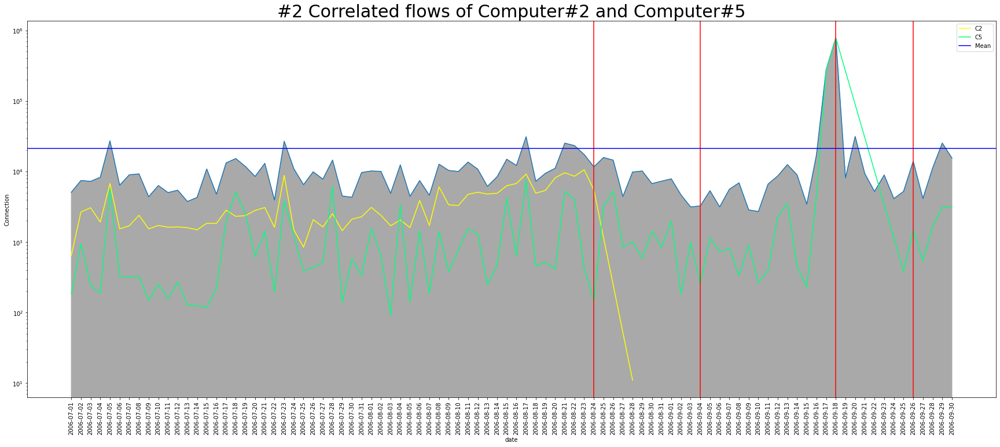

In [35]:
#2 Visualizing: activity of the flow correlated Computer#2 and Computer#5
plot.figure(figsize=(30,12))
plot.plot(daily_aggregate_flow['date'],daily_aggregate_flow['f'])
#plot.plot(daily_aggregate_flow1['date'],daily_aggregate_flow1['flows_C#1'], color= 'r', label='C1')
plot.plot(daily_aggregate_flow2['date'],daily_aggregate_flow2['flows_C#2'], color= 'yellow', label='C2')
#plot.plot(daily_aggregate_flow3['date'],daily_aggregate_flow3['flows_C#3'], color= 'black', label='C3')
#plot.plot(daily_aggregate_flow4['date'],daily_aggregate_flow4['flows_C#4'], color= 'green', label='C4')
plot.plot(daily_aggregate_flow5['date'],daily_aggregate_flow5['flows_C#5'], color= 'springgreen', label='C5')
#plot.plot(daily_aggregate_flow6['date'],daily_aggregate_flow6['flows_C#6'], color= 'midnightblue', label='C6')
#plot.plot(daily_aggregate_flow7['date'],daily_aggregate_flow7['flows_C#7'], color= 'm', label='C7')
#plot.plot(daily_aggregate_flow8['date'],daily_aggregate_flow8['flows_C#8'], color= 'darkviolet', label='C8')
#plot.plot(daily_aggregate_flow9['date'],daily_aggregate_flow9['flows_C#9'], color= 'firebrick', label='C9')
#plot.plot(daily_aggregate_flow10['date'],daily_aggregate_flow10['flows_C#10'], color= 'white', label='C10')
[plot.axvline(x=_x, color='r') for _x,ip in list(marked_anom[['date','l_ipn']].to_records(index=False))]
plot.axhline(y= daily_mean, color='b', label = 'Mean')
#plot.plot(daily_aggregate_flow['date'],daily_aggregate_flow['f'].rolling(5).mean(), color='darkorange', label = '5 days Moving Average')
plot.xticks(daily_aggregate_flow['date'][::1],  rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('#2 Correlated flows of Computer#2 and Computer#5',fontsize=30,ha='center')
plot.fill_between(daily_aggregate_flow['date'],daily_aggregate_flow['f'],color='darkgray')
plot.legend()
plot.show()

In [36]:
#2 Report: Most contacted servers by correlated Computer#2 and Computer#5
m2=sorted(Computer2['r_asn'].value_counts()[:30].index.tolist())
m5=sorted(Computer5['r_asn'].value_counts()[:30].index.tolist())
m2_5 = pandas.DataFrame(
    {'m2': m2,
     'm5': m5,})
m2_5

,m2,m5
0,680,1668
1,2828,3320
2,3265,3462
3,3320,3561
4,3462,4134
5,3561,4323
6,3786,4766
7,4134,4812
8,4266,4837
9,4323,6428


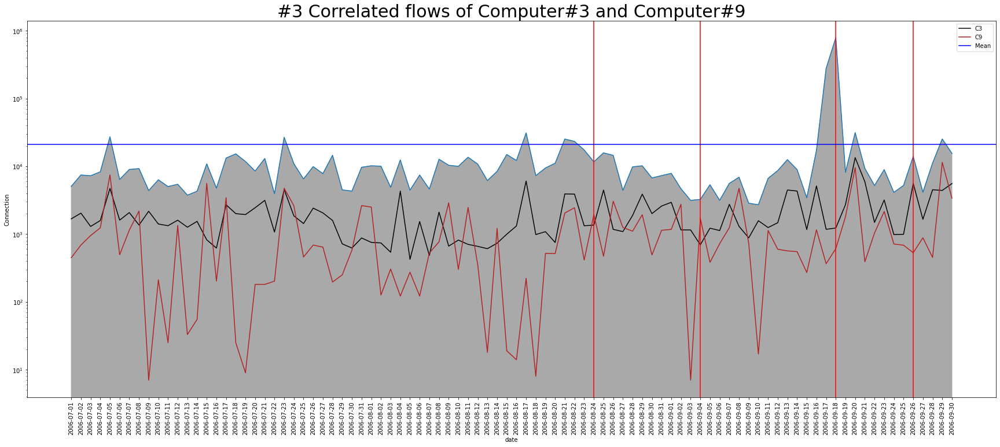

In [37]:
#3 Visualizing: activity of the flow correlated Computer#3 and Computer#9.
plot.figure(figsize=(30,12))
plot.plot(daily_aggregate_flow['date'],daily_aggregate_flow['f'])
#plot.plot(daily_aggregate_flow1['date'],daily_aggregate_flow1['flows_C#1'], color= 'r', label='C1')
#plot.plot(daily_aggregate_flow2['date'],daily_aggregate_flow2['flows_C#2'], color= 'yellow', label='C2')
plot.plot(daily_aggregate_flow3['date'],daily_aggregate_flow3['flows_C#3'], color= 'black', label='C3')
#plot.plot(daily_aggregate_flow4['date'],daily_aggregate_flow4['flows_C#4'], color= 'green', label='C4')
#plot.plot(daily_aggregate_flow5['date'],daily_aggregate_flow5['flows_C#5'], color= 'springgreen', label='C5')
#plot.plot(daily_aggregate_flow6['date'],daily_aggregate_flow6['flows_C#6'], color= 'midnightblue', label='C6')
#plot.plot(daily_aggregate_flow7['date'],daily_aggregate_flow7['flows_C#7'], color= 'm', label='C7')
#plot.plot(daily_aggregate_flow8['date'],daily_aggregate_flow8['flows_C#8'], color= 'darkviolet', label='C8')
plot.plot(daily_aggregate_flow9['date'],daily_aggregate_flow9['flows_C#9'], color= 'firebrick', label='C9')
#plot.plot(daily_aggregate_flow10['date'],daily_aggregate_flow10['flows_C#10'], color= 'white', label='C10')
[plot.axvline(x=_x, color='r') for _x,ip in list(marked_anom[['date','l_ipn']].to_records(index=False))]
plot.axhline(y= daily_mean, color='b', label = 'Mean')
#plot.plot(daily_aggregate['date'],daily_aggregate['f'].rolling(5).mean(), color='darkorange', label = '5 days Moving Average')
plot.xticks(daily_aggregate_flow['date'][::1],  rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('#3 Correlated flows of Computer#3 and Computer#9',fontsize=30,ha='center')
plot.fill_between(daily_aggregate_flow['date'],daily_aggregate_flow['f'],color='darkgray')
plot.legend()
plot.show()

In [38]:
#3 Report: Most contacted servers by correlated Computer#3 and Computer#9.
m3=sorted(Computer3['r_asn'].value_counts()[:30].index.tolist())
m9=sorted(Computer9['r_asn'].value_counts()[:30].index.tolist())
m3_9 = pandas.DataFrame(
    {'m3': m3,
     'm9': m9,})
m3_9

,m3,m9
0,81,3
1,209,109
2,1312,209
3,3557,786
4,3561,1668
5,3659,2152
6,4134,2914
7,4323,3356
8,4983,3561
9,5617,3701


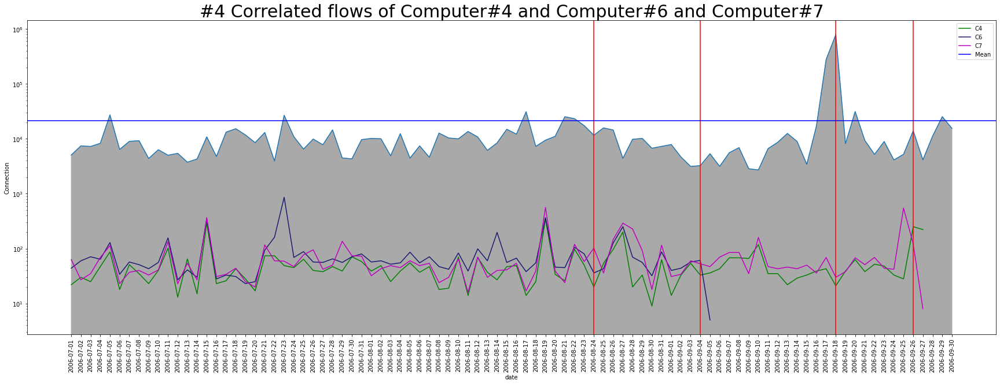

In [39]:
#4 Visualizing: activity of the flow correlated Computer#4 and Computer#6 and Computer#7.
plot.figure(figsize=(30,10))
plot.plot(daily_aggregate_flow['date'],daily_aggregate_flow['f'])
#plot.plot(daily_aggregate_flow1['date'],daily_aggregate_flow1['flows_C#1'], color= 'r', label='C1')
#plot.plot(daily_aggregate_flow2['date'],daily_aggregate_flow2['flows_C#2'], color= 'yellow', label='C2')
#plot.plot(daily_aggregate_flow3['date'],daily_aggregate_flow3['flows_C#3'], color= 'black', label='C3')
plot.plot(daily_aggregate_flow4['date'],daily_aggregate_flow4['flows_C#4'], color= 'green', label='C4')
#plot.plot(daily_aggregate_flow5['date'],daily_aggregate_flow5['flows_C#5'], color= 'springgreen', label='C5')
plot.plot(daily_aggregate_flow6['date'],daily_aggregate_flow6['flows_C#6'], color= 'midnightblue', label='C6')
plot.plot(daily_aggregate_flow7['date'],daily_aggregate_flow7['flows_C#7'], color= 'm', label='C7')
#plot.plot(daily_aggregate_flow8['date'],daily_aggregate_flow8['flows_C#8'], color= 'darkviolet', label='C8')
#plot.plot(daily_aggregate_flow9['date'],daily_aggregate_flow9['flows_C#9'], color= 'firebrick', label='C9')
#plot.plot(daily_aggregate_flow10['date'],daily_aggregate_flow10['flows_C#10'], color= 'white', label='C10')
[plot.axvline(x=_x, color='r') for _x,ip in list(marked_anom[['date','l_ipn']].to_records(index=False))]
plot.axhline(y= daily_mean, color='b', label = 'Mean')
#plot.plot(daily_aggregate_flow['date'],daily_aggregate_flow['f'].rolling(5).mean(), color='darkorange', label = '5 days Moving Average')
plot.xticks(daily_aggregate_flow['date'][::1],  rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('#4 Correlated flows of Computer#4 and Computer#6 and Computer#7',fontsize=30,ha='center')
plot.fill_between(daily_aggregate_flow['date'],daily_aggregate_flow['f'],color='darkgray')
plot.legend()
plot.show()

In [40]:
#4 Report: Most contacted servers by correlated computers#4.#5 and #6   
m4=sorted(Computer4['r_asn'].value_counts()[:30].index.tolist())
m6=sorted(Computer6['r_asn'].value_counts()[:30].index.tolist())
m7=sorted(Computer7['r_asn'].value_counts()[:30].index.tolist())
m4_7_6 = pandas.DataFrame(
    {'m4': m4,
     'm6': m7,
     'm7': m6})
m4_7_6

,m4,m6,m7
0,1239,1239,209
1,2152,2828,2152
2,3269,3269,2828
3,3320,3320,3269
4,3462,3462,3320
5,4134,4134,3356
6,4713,4323,3462
7,4766,4538,3561
8,4808,4713,4134
9,4812,4766,4538


In [41]:
#Planning next steps:
#    a) Evaluate correlations during the dates where attacks are suspected.
#    b) Filter data to find most common r_asn(Remote Servers) connections within correlated relations.
#    c) BTry building a Markov Transitions Matrix

In [42]:
#Generate report of daily number of flows by day, by computer (data Desription).
daily_aggreg_flows_df = df.set_index(['date','r_asn','l_ipn']).unstack('l_ipn') 
daily_aggreg_flows_df.fillna(0).astype(int)

f                                                     
l_ipn                0     1     2    3       4    5    6     7     8     9
date       r_asn                                                           
2006-07-01 25        0     0     0    0       0    0    0     0     4     0
           26        0     0     0    0       0    0    0     0     3     0
           102       0     0     0    0       0    0    0     0     0    43
           109       0     0     0    0       0    0    0     7     7     0
           209       0     0     0    0       0    0    0     0     4     6
           557       0     0     0    0       0    0    0     0    10     0
           559       0     0     0    0       0    0    0     0     0     1
           680       0     1     0    0       0    0    0     0     0     0
           701       1     0     0    0       0    0    0     0     0     8
           714       1     0     0    0       0    0    0     0     0     0
           786       0     0     0    0       0    0    0     0     6     0
           1103      0     0     0    0       0    0    0     0     1     0
           1239      1     6     0    1       5    0    2     0     0    17
           1312      0     0   218    0       0    0    0     0     0     0
           1653      0     0     0    0       0    0    0     0     5     0
           1668      0     0     0    0       1    0    0     0     4     0
           1680      1     0     0    0       0    0    0     0     0     0
           2152      0     0     0    1       0    3    0    46    21   193
           2386      0     0     0    0       0    0    0     0     7     0
           2514      1     0     0    0       0    0    0     0     0     0
           2828      0     2     0    0       0    0    0     0     0     0
           2834      0     0     0    0       0    0    0     0    23     0
           2911      0     0     0    0       0    0    0     0     0    71
           3265      0   519     0    0       0    0    0     0     0     0
           3320      1     0     0    0       0    0    0     0     0     0
           3356      0     0     0    0      21    0    0    55     5    34
           3491      0     0     0    0       0    0    0     3     0     0
           3561     13     0     8    0      10    3    0    35     5    13
           3582      0     0     0    0       0    0    0    10     0     0
           3659      0     0     1    0       0    0    0     0     0     0
           3701      0     0     0    0       0    0    0     0     4     0
           3999      0     0     0    0       0    0    0     0     1     0
           4134      3     9     0    1       0    1   14     0     0     0
           4266      0     0     0    0       0    0    0     0     4     0
           4267      0     0     0    0       0    0    0     0     0     2
           4323      0     0     8    0       1    0    0     0     0     0
           4513      0     0     0    0       0    0    0     6     0     0
           4804      0     1     0    0       0    0    0     0     0     0
           4808      0     3     0    7       0    7    8     0     0     0
           4837      0     0     0    0       0    0    6     0     0     0
           5617      2     0     3    0       0    0    0     0     0     0
           5653      0     0     0    0       0    0    0     0    16     0
           5661      0     0     6    0       0    0    0     0     0     0
           5662      0     0     0    0       0    0    0     0    13     0
           5779      0     0     0    0       0    0    0     0     0   104
           6140      0     0     0    0       0    0    0     0     4     0
           6432      0     0     0    0       0    0    0    10     0     5
           6453      0     0     0    0       0    0    0     0     4     7
           6478      1     0     0    0       0    0    0     0     0     0
           6713      1     7     0    0       0    0    0     0     0

In [43]:
#Generate report of daily number of flows by day, by computer.
daily_aggreg_flows_df.describe().fillna(0).astype(int)

f                                                        
l_ipn     0     1     2     3       4     5     6     7     8     9
count  3980  2159  2416  1186    1308  1249  1305  2233  2230  2737
mean     26    90    81     4     898     4     5    15    53    39
std     232   466   299    16   22963    15    23    41   341   108
min       1     1     1     1       1     1     1     1     1     1
25%       1     1     2     1       1     1     1     2     2     2
50%       1     2     6     2       4     2     2     4     4     6
75%       2     5    47     2      30     4     3    13     9    21
max    5059  4718  5214   313  784234   322   530  1057  7902  1027

In [44]:
#Generating: variables to store queries of connections of correlated computers with some of the most contacted servers.
#df.loc[(df["l_ipn"] == 3) & (df["date"] == '2006-09-06')] #Confirming there was no traffic from Computer5 after 2006-09-06.
asn_3269_c4 = df.loc[(df['l_ipn']== 3) & (df['r_asn'] == 3269)]
asn_3269_c6 = df.loc[(df['l_ipn']== 5) & (df['r_asn'] == 3269)]
asn_3269_c7 = df.loc[(df['l_ipn']== 6) & (df['r_asn'] == 3269)]
asn_3269 = df.loc[df['r_asn'] == 3269]

asn_3320_c4 = df.loc[(df['l_ipn']== 3) & (df['r_asn'] == 3320)]
asn_3320_c6 = df.loc[(df['l_ipn']== 5) & (df['r_asn'] == 3320)]
asn_3320_c7 = df.loc[(df['l_ipn']== 6) & (df['r_asn'] == 3320)]
asn_3320 = df.loc[df['r_asn'] == 3320]

asn_4134_c4 = df.loc[(df['l_ipn']== 3) & (df['r_asn'] == 4134)]
asn_4134_c6 = df.loc[(df['l_ipn']== 5) & (df['r_asn'] == 4134)]
asn_4134_c7 = df.loc[(df['l_ipn']== 6) & (df['r_asn'] == 4134)]
asn_4134 = df.loc[df['r_asn'] == 4134]

asn_4713_c4 = df.loc[(df['l_ipn']== 3) & (df['r_asn'] == 4713)]
asn_4713_c6 = df.loc[(df['l_ipn']== 5) & (df['r_asn'] == 4713)]
asn_4713_c7 = df.loc[(df['l_ipn']== 6) & (df['r_asn'] == 4713)]
asn_4713 = df.loc[df['r_asn'] == 4713]

asn_4766_c4 = df.loc[(df['l_ipn']== 3) & (df['r_asn'] == 4766)]
asn_4766_c6 = df.loc[(df['l_ipn']== 5) & (df['r_asn'] == 4766)]
asn_4766_c7 = df.loc[(df['l_ipn']== 6) & (df['r_asn'] == 4766)]
asn_4766 = df.loc[df['r_asn'] == 4766]

asn_4812_c4 = df.loc[(df['l_ipn']== 3) & (df['r_asn'] == 4812)]
asn_4812_c6 = df.loc[(df['l_ipn']== 5) & (df['r_asn'] == 4812)]
asn_4812_c7 = df.loc[(df['l_ipn']== 6) & (df['r_asn'] == 4812)]
asn_4812 = df.loc[df['r_asn'] == 4812]

asn_4812_c4 = df.loc[(df['l_ipn']== 3) & (df['r_asn'] == 4812)]
asn_4812_c6 = df.loc[(df['l_ipn']== 5) & (df['r_asn'] == 4812)]
asn_4812_c7 = df.loc[(df['l_ipn']== 6) & (df['r_asn'] == 4812)]
asn_4812 = df.loc[df['r_asn'] == 4812]

asn_4837_c4 = df.loc[(df['l_ipn']== 3) & (df['r_asn'] == 4837)]
asn_4837_c6 = df.loc[(df['l_ipn']== 5) & (df['r_asn'] == 4837)]
asn_4837_c7 = df.loc[(df['l_ipn']== 6) & (df['r_asn'] == 4837)]
asn_4837 = df.loc[df['r_asn'] == 4837]


asn_3561_c1 = df.loc[(df['l_ipn']== 0) & (df['r_asn'] == 3561)]
asn_3561_c3 = df.loc[(df['l_ipn']== 2) & (df['r_asn'] == 3561)]

asn_3561_c4 = df.loc[(df['l_ipn']== 3) & (df['r_asn'] == 3561)]
asn_3561_c6 = df.loc[(df['l_ipn']== 5) & (df['r_asn'] == 3561)]
asn_3561_c7 = df.loc[(df['l_ipn']== 6) & (df['r_asn'] == 3561)]
asn_3561_c2 = df.loc[(df['l_ipn']== 1) & (df['r_asn'] == 3561)]
asn_3561_c5 = df.loc[(df['l_ipn']== 4) & (df['r_asn'] == 3561)]
asn_3561_c8 = df.loc[(df['l_ipn']== 7) & (df['r_asn'] == 3561)]
asn_3561_c9 = df.loc[(df['l_ipn']== 8) & (df['r_asn'] == 3561)]
asn_3561 = df.loc[df['r_asn'] == 3561]



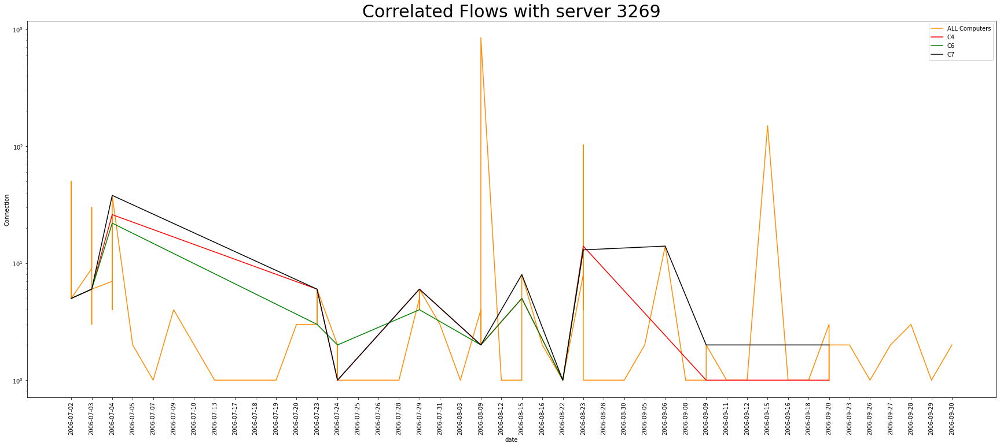

In [45]:
#Plotting Flows of Correlated Flows of server 3269
plot.figure(figsize=(30,12))
plot.plot(asn_3269['date'],asn_3269['f'], color= 'darkorange', label='ALL Computers')
plot.plot(asn_3269_c4['date'],asn_3269_c4['f'], color= 'r', label='C4')
plot.plot(asn_3269_c6['date'],asn_3269_c6['f'], color= 'g', label='C6')
plot.plot(asn_3269_c7['date'],asn_3269_c7['f'], color= 'black', label='C7')
plot.xticks(rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Correlated Flows with server 3269',fontsize=30,ha='center')
plot.legend()
plot.show()

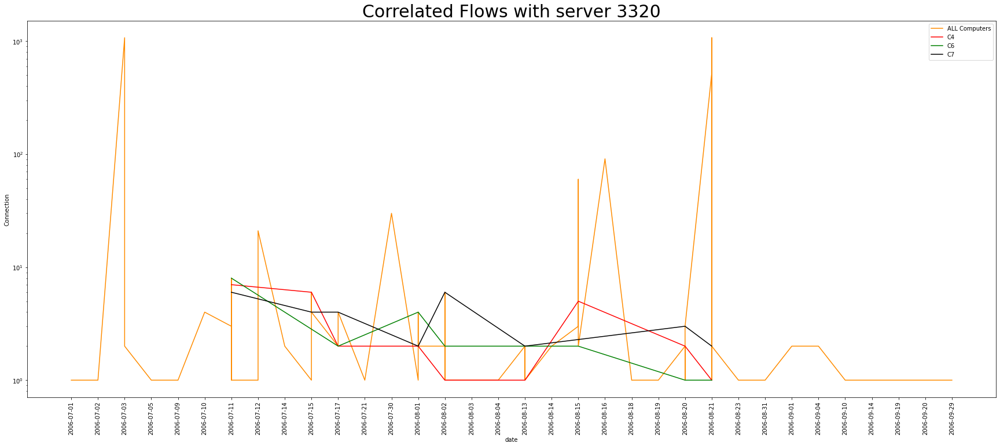

In [46]:
#Plotting Flows of Correlated Flows of server 3269
plot.figure(figsize=(30,12))
plot.plot(asn_3320['date'],asn_3320['f'], color= 'darkorange', label='ALL Computers')
plot.plot(asn_3320_c4['date'],asn_3320_c4['f'], color= 'r', label='C4')
plot.plot(asn_3320_c6['date'],asn_3320_c6['f'], color= 'g', label='C6')
plot.plot(asn_3320_c7['date'],asn_3320_c7['f'], color= 'black', label='C7')
plot.xticks(rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Correlated Flows with server 3320',fontsize=30,ha='center')
plot.legend()
plot.show()

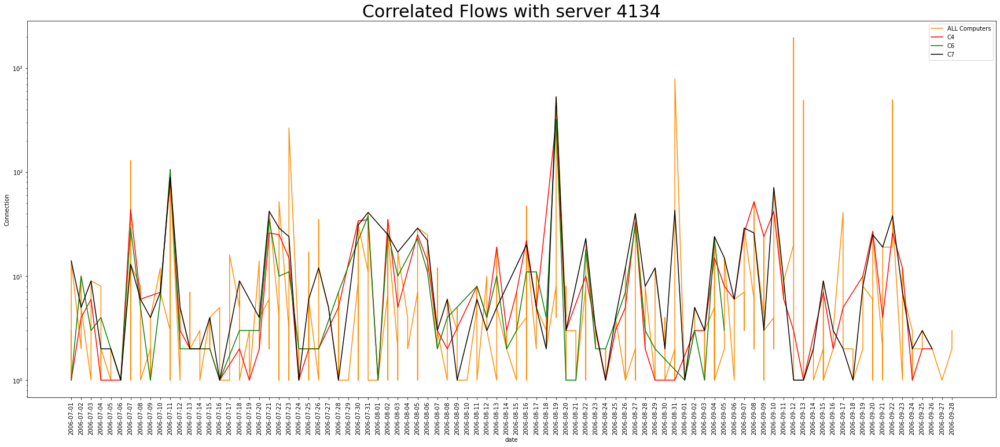

In [47]:
#Plotting Flows of Correlated Flows of server 3462
plot.figure(figsize=(30,12))
plot.plot(asn_4134['date'],asn_4134['f'], color= 'darkorange', label='ALL Computers')
plot.plot(asn_4134_c4['date'],asn_4134_c4['f'], color= 'r', label='C4')
plot.plot(asn_4134_c6['date'],asn_4134_c6['f'], color= 'g', label='C6')
plot.plot(asn_4134_c7['date'],asn_4134_c7['f'], color= 'black', label='C7')
plot.xticks(rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Correlated Flows with server 4134',fontsize=30,ha='center')
plot.legend()
plot.show()

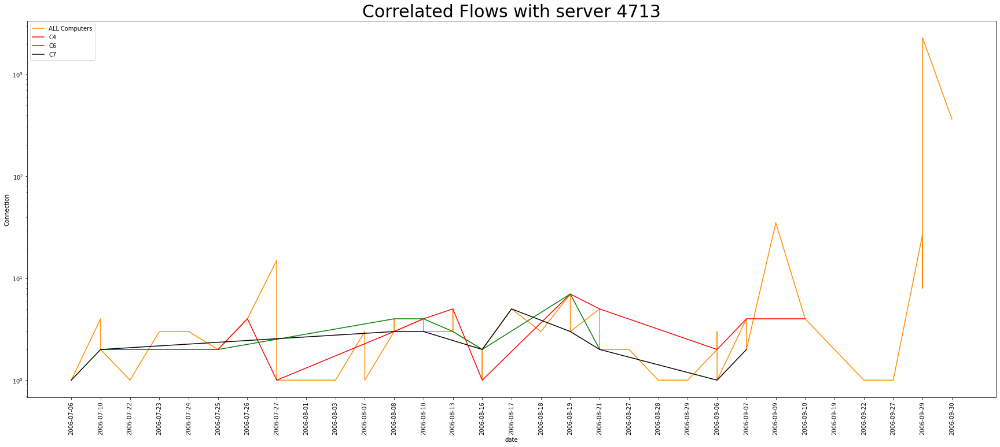

In [48]:
#Plotting Flows of Correlated Flows of server 4713
plot.figure(figsize=(30,12))
plot.plot(asn_4713['date'],asn_4713['f'], color= 'darkorange', label='ALL Computers')
plot.plot(asn_4713_c4['date'],asn_4713_c4['f'], color= 'r', label='C4')
plot.plot(asn_4713_c6['date'],asn_4713_c6['f'], color= 'g', label='C6')
plot.plot(asn_4713_c7['date'],asn_4713_c7['f'], color= 'black', label='C7')
plot.xticks(rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Correlated Flows with server 4713',fontsize=30,ha='center')
plot.legend()
plot.show()

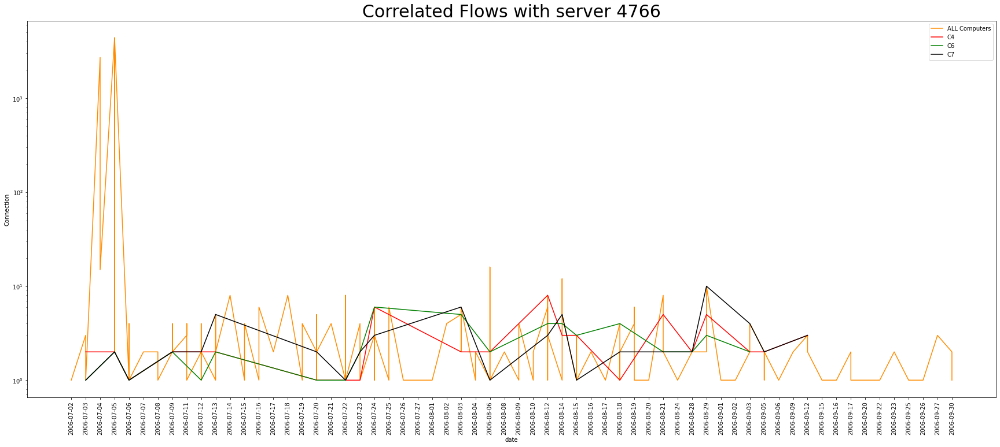

In [49]:
#Plotting Flows of Correlated Flows of server 4766
plot.figure(figsize=(30,12))
plot.plot(asn_4766['date'],asn_4766['f'], color= 'darkorange', label='ALL Computers')
plot.plot(asn_4766_c4['date'],asn_4766_c4['f'], color= 'r', label='C4')
plot.plot(asn_4766_c6['date'],asn_4766_c6['f'], color= 'g', label='C6')
plot.plot(asn_4766_c7['date'],asn_4766_c7['f'], color= 'black', label='C7')
plot.xticks(rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Correlated Flows with server 4766',fontsize=30,ha='center')
plot.legend()
plot.show()

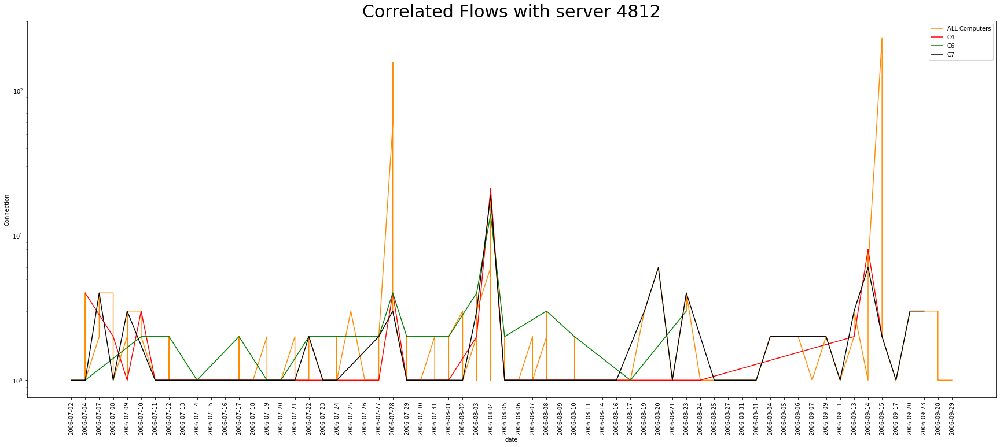

In [50]:
#Plotting Flows of Correlated Flows of server 4812
plot.figure(figsize=(30,12))
plot.plot(asn_4812['date'],asn_4812['f'], color= 'darkorange', label='ALL Computers')
plot.plot(asn_4812_c4['date'],asn_4812_c4['f'], color= 'r', label='C4')
plot.plot(asn_4812_c6['date'],asn_4812_c6['f'], color= 'g', label='C6')
plot.plot(asn_4812_c7['date'],asn_4812_c7['f'], color= 'black', label='C7')
plot.xticks(rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Correlated Flows with server 4812',fontsize=30,ha='center')
plot.legend()
plot.show()

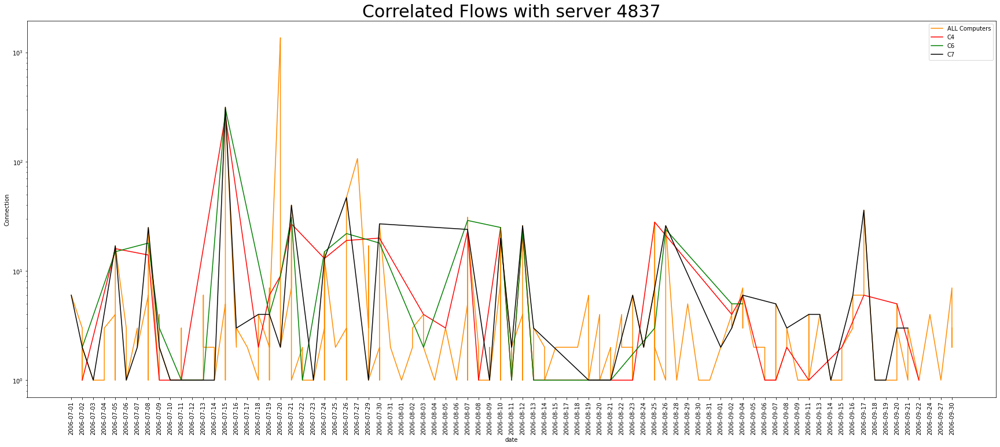

In [51]:
#Plotting Flows of Correlated Flows of server 4837
plot.figure(figsize=(30,12))
plot.plot(asn_4837['date'],asn_4837['f'], color= 'darkorange', label='ALL Computers')
plot.plot(asn_4837_c4['date'],asn_4837_c4['f'], color= 'r', label='C4')
plot.plot(asn_4837_c6['date'],asn_4837_c6['f'], color= 'g', label='C6')
plot.plot(asn_4837_c7['date'],asn_4837_c7['f'], color= 'black', label='C7')
plot.xticks(rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Correlated Flows with server 4837',fontsize=30,ha='center')
plot.legend()
plot.show()

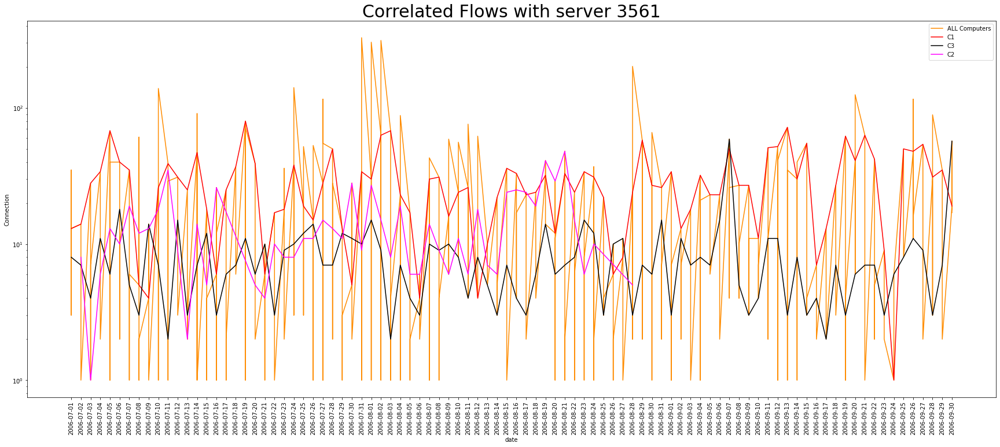

In [52]:
#Plotting Flows of Correlated Flows of server 3561
plot.figure(figsize=(30,12))
plot.plot(asn_3561['date'],asn_3561['f'], color= 'darkorange', label='ALL Computers')
plot.plot(asn_3561_c1['date'],asn_3561_c1['f'], color= 'r', label='C1')
plot.plot(asn_3561_c3['date'],asn_3561_c3['f'], color= 'black', label='C3')
#plot.plot(asn_3561_c4['date'],asn_3561_c4['f'], color= 'lightseagreen', label='C4')
#plot.plot(asn_3561_c6['date'],asn_3561_c6['f'], color= 'lime', label='C6')
#plot.plot(asn_3561_c7['date'],asn_3561_c7['f'], color= 'turquoise', label='C7')
plot.plot(asn_3561_c2['date'],asn_3561_c2['f'], color= 'fuchsia', label='C2')
#plot.plot(asn_3561_c5['date'],asn_3561_c5['f'], color= 'darkgrey', label='C5')
#plot.plot(asn_3561_c8['date'],asn_3561_c8['f'], color= 'darkgrey', label='C8')
#plot.plot(asn_3561_c9['date'],asn_3561_c9['f'], color= 'darkgrey', label='C9')
plot.xticks(rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Correlated Flows with server 3561',fontsize=30,ha='center')
plot.legend()
plot.show()

In [ ]:
# _3 Calculating and Visualizing Aggregate Connection Sessions (number of connections established by l_ipn computers with r_asn each server)

In [53]:
#Generating: a variable for each computer to store their aggregate number of connection sessions for use in the time series graphs.
Computer1 = df.loc[df["l_ipn"] == 0]
Computer2 = df.loc[df["l_ipn"] == 1]
Computer3 = df.loc[df["l_ipn"] == 2]
Computer4 = df.loc[df["l_ipn"] == 3]
Computer5 = df.loc[df["l_ipn"] == 4]
Computer6 = df.loc[df["l_ipn"] == 5]
Computer7 = df.loc[df["l_ipn"] == 6]
Computer8 = df.loc[df["l_ipn"] == 7]
Computer9 = df.loc[df["l_ipn"] == 8]
Computer10 = df.loc[df["l_ipn"] == 9]

daily_Serv_Count = df.groupby(['date'])[['r_asn']].count() 
daily_Serv_Count.reset_index(inplace = True)
daily_Serv_Count

daily_Serv_Count1 = Computer1.groupby(['date'])[['r_asn']].count()
daily_Serv_Count1.reset_index(inplace = True)
daily_Serv_Count1 = daily_Serv_Count1.rename(columns={'r_asn':'Srv-to-Comp#1'})

daily_Serv_Count2 = Computer2.groupby(['date'])[['r_asn']].count()
daily_Serv_Count2.reset_index(inplace = True)
daily_Serv_Count2 = daily_Serv_Count2.rename(columns={'r_asn':'Srv-to-Comp#2'})

daily_Serv_Count3 = Computer3.groupby(['date'])[['r_asn']].count()
daily_Serv_Count3.reset_index(inplace = True)
daily_Serv_Count3 = daily_Serv_Count3.rename(columns={'r_asn':'Srv-to-Comp#3'})

daily_Serv_Count4 = Computer4.groupby(['date'])[['r_asn']].count()
daily_Serv_Count4.reset_index(inplace = True)
daily_Serv_Count4 = daily_Serv_Count4.rename(columns={'r_asn':'Srv-to-Comp#4'})

daily_Serv_Count5 = Computer5.groupby(['date'])[['r_asn']].count()
daily_Serv_Count5.reset_index(inplace = True)
daily_Serv_Count5 = daily_Serv_Count5.rename(columns={'r_asn':'Srv-to-Comp#5'})

daily_Serv_Count6 = Computer6.groupby(['date'])[['r_asn']].count()
daily_Serv_Count6.reset_index(inplace = True)
daily_Serv_Count6 = daily_Serv_Count6.rename(columns={'r_asn':'Srv-to-Comp#6'})

daily_Serv_Count7 = Computer7.groupby(['date'])[['r_asn']].count()
daily_Serv_Count7.reset_index(inplace = True)
daily_Serv_Count7 = daily_Serv_Count7.rename(columns={'r_asn':'Srv-to-Comp#7'})

daily_Serv_Count8 = Computer10.groupby(['date'])[['r_asn']].count()
daily_Serv_Count8.reset_index(inplace = True)
daily_Serv_Count8 = daily_Serv_Count8.rename(columns={'r_asn':'Srv-to-Comp#8'})

daily_Serv_Count9 = Computer9.groupby(['date'])[['r_asn']].count()
daily_Serv_Count9.reset_index(inplace = True)
daily_Serv_Count9 = daily_Serv_Count9.rename(columns={'r_asn':'Srv-to-Comp#9'})

daily_Serv_Count10 = Computer10.groupby(['date'])[['r_asn']].count()
daily_Serv_Count10.reset_index(inplace = True)
daily_Serv_Count10 = daily_Serv_Count10.rename(columns={'r_asn':'Srv-to-Comp#10'})

daily_Serv_Count



,date,r_asn
0,2006-07-01,220
1,2006-07-02,145
2,2006-07-03,286
3,2006-07-04,229
4,2006-07-05,282
5,2006-07-06,255
6,2006-07-07,207
7,2006-07-08,219
8,2006-07-09,142
9,2006-07-10,251


In [54]:
#Generating a dictionary with the info posted with the data set challenge about suspected attack dates.
dictionary = {'2006-08-24':1,'2006-09-04':5,'2006-09-18':4,'2006-09-26':3}
marked_anom = pandas.DataFrame.from_dict(dictionary,orient='index')
marked_anom.reset_index(inplace = True)
marked_anom.columns = ['date','l_ipn']
print(marked_anom)

         date  l_ipn
0  2006-08-24      1
1  2006-09-04      5
2  2006-09-18      4
3  2006-09-26      3


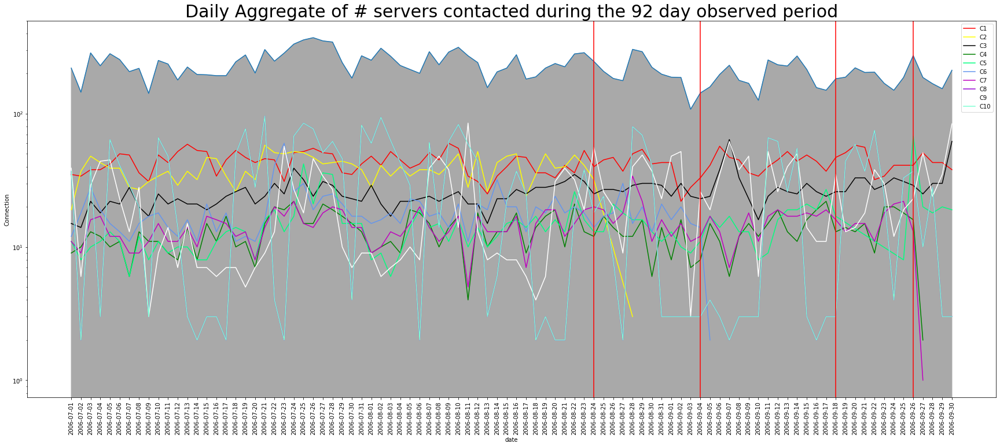

In [55]:
#Plotting Daily Aggregate of # servers contacted by each of the ten computers.
plot.figure(figsize=(30,12))
plot.plot(daily_Serv_Count['date'],daily_Serv_Count['r_asn'])
plot.plot(daily_Serv_Count1['date'],daily_Serv_Count1['Srv-to-Comp#1'], color= 'r', label='C1')
plot.plot(daily_Serv_Count2['date'],daily_Serv_Count2['Srv-to-Comp#2'], color= 'yellow', label='C2')
plot.plot(daily_Serv_Count3['date'],daily_Serv_Count3['Srv-to-Comp#3'], color= 'black', label='C3')
plot.plot(daily_Serv_Count4['date'],daily_Serv_Count4['Srv-to-Comp#4'], color= 'green', label='C4')
plot.plot(daily_Serv_Count5['date'],daily_Serv_Count5['Srv-to-Comp#5'], color= 'springgreen', label='C5')
plot.plot(daily_Serv_Count6['date'],daily_Serv_Count6['Srv-to-Comp#6'], color= 'cornflowerblue', label='C6')
plot.plot(daily_Serv_Count7['date'],daily_Serv_Count7['Srv-to-Comp#7'], color= 'm', label='C7')
plot.plot(daily_Serv_Count8['date'],daily_Serv_Count8['Srv-to-Comp#8'], color= 'darkviolet', label='C8')
plot.plot(daily_Serv_Count9['date'],daily_Serv_Count9['Srv-to-Comp#9'], color= 'white', label='C9')
plot.plot(daily_Serv_Count10['date'],daily_Serv_Count10['Srv-to-Comp#10'], color= 'aquamarine', label='C10')
[plot.axvline(x=_x, color='r') for _x,ip in list(marked_anom[['date','l_ipn']].to_records(index=False))]
plot.xticks(daily_Serv_Count['date'][::1],  rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Daily Aggregate of # servers contacted during the 92 day observed period',fontsize=30,ha='center')
plot.fill_between(daily_Serv_Count['date'],daily_Serv_Count['r_asn'],color='darkgray')
plot.legend()
plot.show()

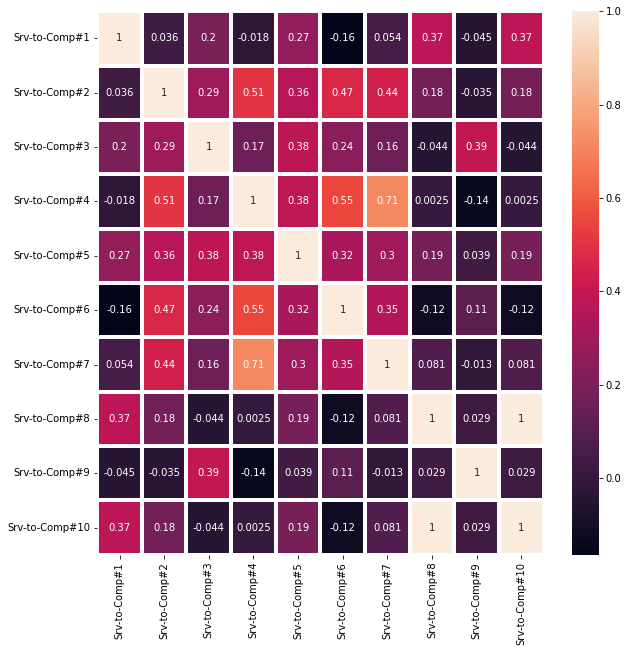

In [56]:
#Plotting a correlation matrix of all computer's aggregated connection sessions.
corrMatrix = pandas.concat([daily_Serv_Count1['Srv-to-Comp#1'], daily_Serv_Count2['Srv-to-Comp#2'], daily_Serv_Count3['Srv-to-Comp#3'], daily_Serv_Count4['Srv-to-Comp#4'], daily_Serv_Count5['Srv-to-Comp#5'], daily_Serv_Count6['Srv-to-Comp#6'], daily_Serv_Count7['Srv-to-Comp#7'], daily_Serv_Count8['Srv-to-Comp#8'], daily_Serv_Count9['Srv-to-Comp#9'], daily_Serv_Count10['Srv-to-Comp#10']], axis=1).corr()
plot.subplots(figsize=(10,10))
seaborn.heatmap(corrMatrix.iloc[:, 0:10:], annot=True, linewidths=4)
plot.show()

In [57]:
#Generating report of ALL daily aggregate connections sessions between each computer and servers.
daily_aggreg_connections_ALL = pandas.DataFrame.from_dict(
    {'Srv-to-Comp#1':daily_Serv_Count1['Srv-to-Comp#1'],
     'Srv-to-Comp#2':daily_Serv_Count2['Srv-to-Comp#2'],
     'Srv-to-Comp#3':daily_Serv_Count3['Srv-to-Comp#3'],
     'Srv-to-Comp#4':daily_Serv_Count4['Srv-to-Comp#4'],
     'Srv-to-Comp#5':daily_Serv_Count5['Srv-to-Comp#5'],
     'Srv-to-Comp#6':daily_Serv_Count6['Srv-to-Comp#6'],
     'Srv-to-Comp#7':daily_Serv_Count7['Srv-to-Comp#7'],
     'Srv-to-Comp#8':daily_Serv_Count8['Srv-to-Comp#8'],
     'Srv-to-Comp#9':daily_Serv_Count9['Srv-to-Comp#9'],
     'Srv-to-Comp#10':daily_Serv_Count10['Srv-to-Comp#10']
    }, orient='index')

daily_aggreg_connections_ALL.transpose().fillna(0).astype(int)

,Srv-to-Comp#1,Srv-to-Comp#2,Srv-to-Comp#3,Srv-to-Comp#4,Srv-to-Comp#5,Srv-to-Comp#6,Srv-to-Comp#7,Srv-to-Comp#8,Srv-to-Comp#9,Srv-to-Comp#10
0,35,19,15,9,11,12,11,37,39,37
1,34,37,14,10,8,18,9,2,6,2
2,38,48,22,13,10,28,16,40,29,40
3,38,43,18,12,11,19,17,3,44,3
4,42,39,22,10,13,15,12,64,45,64
5,50,39,21,11,11,13,12,41,23,41
6,49,28,28,6,6,11,9,29,13,29
7,36,27,20,13,12,15,9,20,28,20
8,31,31,17,11,8,17,11,3,3,3
9,49,34,25,11,11,18,15,66,9,66


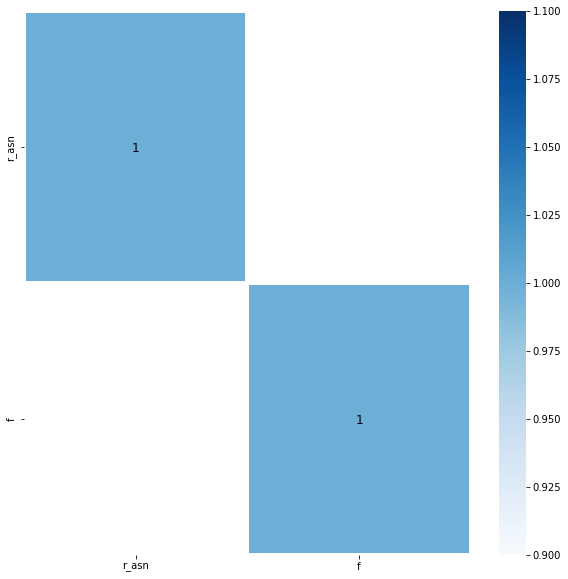

In [58]:
daily_aggregate = df.groupby(['date'])[['f']].sum() #Daily aggregate of all traffic(from previous page about flows).+ccoaily_aggregate.reset_index(inplace = True)

#Plotting a correlation matrix of all daily flows vs. server connection sessions.
corrMatrix = pandas.concat([daily_Serv_Count['r_asn'], daily_aggregate['f']], axis=1).corr()
plot.subplots(figsize=(10,10))
seaborn.heatmap(corrMatrix.iloc[:, 0:10:], cmap="Blues", annot=True, annot_kws={"size": 12, "va": "center_baseline", "color": "black" },linewidths=4)
plot.show()

In [59]:
#Generate report of daily number of flows by day, by computer (data Desription).
daily_aggreg_flows_df = df.set_index(['date','r_asn','l_ipn']).unstack('l_ipn') 
daily_aggreg_flows_df.fillna(0).astype(int)

f                                                     
l_ipn                0     1     2    3       4    5    6     7     8     9
date       r_asn                                                           
2006-07-01 25        0     0     0    0       0    0    0     0     4     0
           26        0     0     0    0       0    0    0     0     3     0
           102       0     0     0    0       0    0    0     0     0    43
           109       0     0     0    0       0    0    0     7     7     0
           209       0     0     0    0       0    0    0     0     4     6
           557       0     0     0    0       0    0    0     0    10     0
           559       0     0     0    0       0    0    0     0     0     1
           680       0     1     0    0       0    0    0     0     0     0
           701       1     0     0    0       0    0    0     0     0     8
           714       1     0     0    0       0    0    0     0     0     0
           786       0     0     0    0       0    0    0     0     6     0
           1103      0     0     0    0       0    0    0     0     1     0
           1239      1     6     0    1       5    0    2     0     0    17
           1312      0     0   218    0       0    0    0     0     0     0
           1653      0     0     0    0       0    0    0     0     5     0
           1668      0     0     0    0       1    0    0     0     4     0
           1680      1     0     0    0       0    0    0     0     0     0
           2152      0     0     0    1       0    3    0    46    21   193
           2386      0     0     0    0       0    0    0     0     7     0
           2514      1     0     0    0       0    0    0     0     0     0
           2828      0     2     0    0       0    0    0     0     0     0
           2834      0     0     0    0       0    0    0     0    23     0
           2911      0     0     0    0       0    0    0     0     0    71
           3265      0   519     0    0       0    0    0     0     0     0
           3320      1     0     0    0       0    0    0     0     0     0
           3356      0     0     0    0      21    0    0    55     5    34
           3491      0     0     0    0       0    0    0     3     0     0
           3561     13     0     8    0      10    3    0    35     5    13
           3582      0     0     0    0       0    0    0    10     0     0
           3659      0     0     1    0       0    0    0     0     0     0
           3701      0     0     0    0       0    0    0     0     4     0
           3999      0     0     0    0       0    0    0     0     1     0
           4134      3     9     0    1       0    1   14     0     0     0
           4266      0     0     0    0       0    0    0     0     4     0
           4267      0     0     0    0       0    0    0     0     0     2
           4323      0     0     8    0       1    0    0     0     0     0
           4513      0     0     0    0       0    0    0     6     0     0
           4804      0     1     0    0       0    0    0     0     0     0
           4808      0     3     0    7       0    7    8     0     0     0
           4837      0     0     0    0       0    0    6     0     0     0
           5617      2     0     3    0       0    0    0     0     0     0
           5653      0     0     0    0       0    0    0     0    16     0
           5661      0     0     6    0       0    0    0     0     0     0
           5662      0     0     0    0       0    0    0     0    13     0
           5779      0     0     0    0       0    0    0     0     0   104
           6140      0     0     0    0       0    0    0     0     4     0
           6432      0     0     0    0       0    0    0    10     0     5
           6453      0     0     0    0       0    0    0     0     4     7
           6478      1     0     0    0       0    0    0     0     0     0
           6713      1     7     0    0       0    0    0     0     0

In [60]:
#Generate report of daily number of flows by day, by computer.
daily_aggreg_flows_df.describe().fillna(0).astype(int)

f                                                        
l_ipn     0     1     2     3       4     5     6     7     8     9
count  3980  2159  2416  1186    1308  1249  1305  2233  2230  2737
mean     26    90    81     4     898     4     5    15    53    39
std     232   466   299    16   22963    15    23    41   341   108
min       1     1     1     1       1     1     1     1     1     1
25%       1     1     2     1       1     1     1     2     2     2
50%       1     2     6     2       4     2     2     4     4     6
75%       2     5    47     2      30     4     3    13     9    21
max    5059  4718  5214   313  784234   322   530  1057  7902  1027

In [61]:
#Generating: a variable for each computer to store their aggregate # of connections, for use in the time series graphs.
Computer1 = df.loc[df["l_ipn"] == 0]
Computer2 = df.loc[df["l_ipn"] == 1]
Computer3 = df.loc[df["l_ipn"] == 2]
Computer4 = df.loc[df["l_ipn"] == 3]
Computer5 = df.loc[df["l_ipn"] == 4]
Computer6 = df.loc[df["l_ipn"] == 5]
Computer7 = df.loc[df["l_ipn"] == 6]
Computer8 = df.loc[df["l_ipn"] == 7]
Computer9 = df.loc[df["l_ipn"] == 8]
Computer10 = df.loc[df["l_ipn"] == 9]

daily_Serv_Count = df.groupby(['date'])[['r_asn']].count() 
daily_Serv_Count.reset_index(inplace = True)
daily_Serv_Count

daily_Serv_Count1 = Computer1.groupby(['date'])[['r_asn']].count()
daily_Serv_Count1.reset_index(inplace = True)
daily_Serv_Count1 = daily_Serv_Count1.rename(columns={'r_asn':'Srv-to-Comp#1'})

daily_Serv_Count2 = Computer2.groupby(['date'])[['r_asn']].count()
daily_Serv_Count2.reset_index(inplace = True)
daily_Serv_Count2 = daily_Serv_Count2.rename(columns={'r_asn':'Srv-to-Comp#2'})

daily_Serv_Count3 = Computer3.groupby(['date'])[['r_asn']].count()
daily_Serv_Count3.reset_index(inplace = True)
daily_Serv_Count3 = daily_Serv_Count3.rename(columns={'r_asn':'Srv-to-Comp#3'})

daily_Serv_Count4 = Computer4.groupby(['date'])[['r_asn']].count()
daily_Serv_Count4.reset_index(inplace = True)
daily_Serv_Count4 = daily_Serv_Count4.rename(columns={'r_asn':'Srv-to-Comp#4'})

daily_Serv_Count5 = Computer5.groupby(['date'])[['r_asn']].count()
daily_Serv_Count5.reset_index(inplace = True)
daily_Serv_Count5 = daily_Serv_Count5.rename(columns={'r_asn':'Srv-to-Comp#5'})

daily_Serv_Count6 = Computer6.groupby(['date'])[['r_asn']].count()
daily_Serv_Count6.reset_index(inplace = True)
daily_Serv_Count6 = daily_Serv_Count6.rename(columns={'r_asn':'Srv-to-Comp#6'})

daily_Serv_Count7 = Computer7.groupby(['date'])[['r_asn']].count()
daily_Serv_Count7.reset_index(inplace = True)
daily_Serv_Count7 = daily_Serv_Count7.rename(columns={'r_asn':'Srv-to-Comp#7'})

daily_Serv_Count8 = Computer8.groupby(['date'])[['r_asn']].count()
daily_Serv_Count8.reset_index(inplace = True)
daily_Serv_Count8 = daily_Serv_Count8.rename(columns={'r_asn':'Srv-to-Comp#8'})

daily_Serv_Count9 = Computer9.groupby(['date'])[['r_asn']].count()
daily_Serv_Count9.reset_index(inplace = True)
daily_Serv_Count9 = daily_Serv_Count9.rename(columns={'r_asn':'Srv-to-Comp#9'})

daily_Serv_Count10 = Computer10.groupby(['date'])[['r_asn']].count()
daily_Serv_Count10.reset_index(inplace = True)
daily_Serv_Count10 = daily_Serv_Count10.rename(columns={'r_asn':'Srv-to-Comp#10'})

daily_Serv_Count



,date,r_asn
0,2006-07-01,220
1,2006-07-02,145
2,2006-07-03,286
3,2006-07-04,229
4,2006-07-05,282
5,2006-07-06,255
6,2006-07-07,207
7,2006-07-08,219
8,2006-07-09,142
9,2006-07-10,251


In [62]:
#Generating a dictionary with the info posted with the data set challenge about suspected attack dates.
dictionary = {'2006-08-24':1,'2006-09-04':5,'2006-09-18':4,'2006-09-26':3}
marked_anom = pandas.DataFrame.from_dict(dictionary,orient='index')
marked_anom.reset_index(inplace = True)
marked_anom.columns = ['date','l_ipn']
print(marked_anom)

         date  l_ipn
0  2006-08-24      1
1  2006-09-04      5
2  2006-09-18      4
3  2006-09-26      3


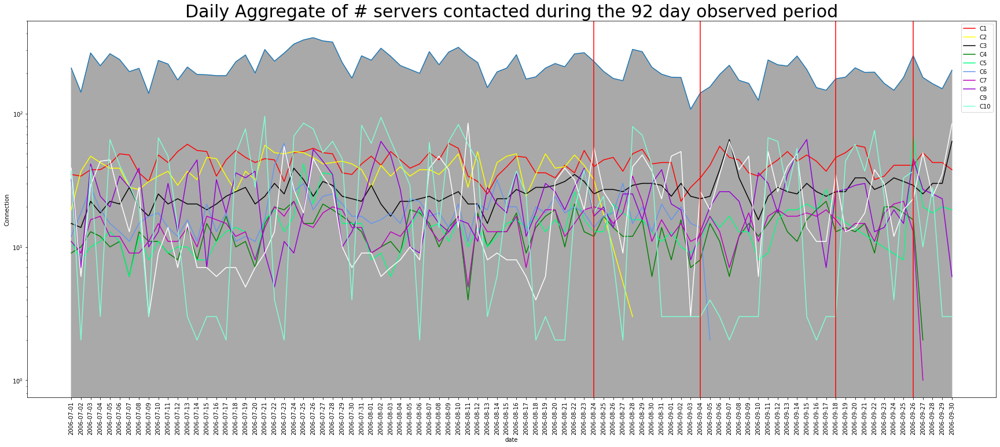

In [63]:
#Plotting Daily Aggregate of # servers contacted by each of the ten computers.
plot.figure(figsize=(30,12))
plot.plot(daily_Serv_Count['date'],daily_Serv_Count['r_asn'])
plot.plot(daily_Serv_Count1['date'],daily_Serv_Count1['Srv-to-Comp#1'], color= 'r', label='C1')
plot.plot(daily_Serv_Count2['date'],daily_Serv_Count2['Srv-to-Comp#2'], color= 'yellow', label='C2')
plot.plot(daily_Serv_Count3['date'],daily_Serv_Count3['Srv-to-Comp#3'], color= 'black', label='C3')
plot.plot(daily_Serv_Count4['date'],daily_Serv_Count4['Srv-to-Comp#4'], color= 'green', label='C4')
plot.plot(daily_Serv_Count5['date'],daily_Serv_Count5['Srv-to-Comp#5'], color= 'springgreen', label='C5')
plot.plot(daily_Serv_Count6['date'],daily_Serv_Count6['Srv-to-Comp#6'], color= 'cornflowerblue', label='C6')
plot.plot(daily_Serv_Count7['date'],daily_Serv_Count7['Srv-to-Comp#7'], color= 'm', label='C7')
plot.plot(daily_Serv_Count8['date'],daily_Serv_Count8['Srv-to-Comp#8'], color= 'darkviolet', label='C8')
plot.plot(daily_Serv_Count9['date'],daily_Serv_Count9['Srv-to-Comp#9'], color= 'white', label='C9')
plot.plot(daily_Serv_Count10['date'],daily_Serv_Count10['Srv-to-Comp#10'], color= 'aquamarine', label='C10')
[plot.axvline(x=_x, color='r') for _x,ip in list(marked_anom[['date','l_ipn']].to_records(index=False))]
plot.xticks(daily_Serv_Count['date'][::1],  rotation='vertical')
plot.yscale('log')
plot.xlabel('date')
plot.ylabel('Connection')
plot.title('Daily Aggregate of # servers contacted during the 92 day observed period',fontsize=30,ha='center')
plot.fill_between(daily_Serv_Count['date'],daily_Serv_Count['r_asn'],color='darkgray')
plot.legend()
plot.show()

In [ ]:
# _4 Applying Markov Chains Prediction Method using the computers with the healthiest connections and flow activity as baseline:

In [94]:
#Creating a dataframe with all daily aggregate connection sessions between SAFE computers and servers.
daily_aggreg_connections_SAFE = pandas.DataFrame.from_dict(
    {
     #'Srv-to-Comp#1':daily_Serv_Count1['Srv-to-Comp#1'],
     #'Srv-to-Comp#2':daily_Serv_Count2['Srv-to-Comp#2'],
     #'Srv-to-Comp#3':daily_Serv_Count3['Srv-to-Comp#3'],
     #'Srv-to-Comp#4':daily_Serv_Count4['Srv-to-Comp#4'],
     'Srv-to-Comp#5':daily_Serv_Count5['Srv-to-Comp#5'],
     #'Srv-to-Comp#6':daily_Serv_Count6['Srv-to-Comp#6'],
     #'Srv-to-Comp#7':daily_Serv_Count7['Srv-to-Comp#7'],
     'Srv-to-Comp#8':daily_Serv_Count8['Srv-to-Comp#8'],
     #'Srv-to-Comp#9':daily_Serv_Count9['Srv-to-Comp#9'],
     'Srv-to-Comp#10':daily_Serv_Count10['Srv-to-Comp#10']
    }, orient='index')

daily_aggreg_connections_SAFE = daily_aggreg_connections_SAFE.transpose().fillna(0).astype(int)
daily_aggreg_connections_SAFE

,Srv-to-Comp#5,Srv-to-Comp#8,Srv-to-Comp#10
0,11,32,37
1,8,7,2
2,10,42,40
3,11,24,3
4,13,20,64
5,11,34,41
6,6,28,29
7,12,39,20
8,8,10,3
9,11,13,66


In [95]:
#Creating a dataframe with all aggregate healthy computer's flow, which will be my healthy traffic baseline.
#Then transforming the dataframe's columns into a list by adding the flow of all its rows.
daily_agg_flow_SAFE = pandas.DataFrame.from_dict({
    'flows_C#5':daily_aggregate_flow5['flows_C#5'],
    'flows_C#8':daily_aggregate_flow8['flows_C#8'], 
    'flows_C#10':daily_aggregate_flow10['flows_C#10']
    })
daily_agg_flow_SAFE = daily_agg_flow_SAFE.fillna(0).astype(int)
daily_agg_flow_SAFE_total_list = daily_agg_flow_SAFE['flows_C#5'] + daily_agg_flow_SAFE['flows_C#8'] + daily_agg_flow_SAFE['flows_C#10']

In [96]:
#Merging my flows dataframe with my new list of healthy flow totals into one dataframe to verify the results of the sum operation:
daily_agg_flow_SAFE["safe_Outcome"] = daily_agg_flow_SAFE_total_list
daily_agg_flow_SAFE.head(5)

,flows_C#5,flows_C#8,flows_C#10,safe_Outcome
0,184,411,1463,2058
1,941,68,5,1014
2,245,474,839,1558
3,187,200,6,393
4,5643,208,1910,7761


In [97]:
#Merging my list of healthy flow totals with the dataframe with the number of healthy computer connections.
daily_aggreg_connections_SAFE['Safe_Outcome'] = daily_agg_flow_SAFE_total_list
daily_aggreg_connections_SAFE_outcome = daily_aggreg_connections_SAFE
daily_aggreg_connections_SAFE_outcome.head(5)

,Srv-to-Comp#5,Srv-to-Comp#8,Srv-to-Comp#10,Safe_Outcome
0,11,32,37,2058
1,8,7,2,1014
2,10,42,40,1558
3,11,24,3,393
4,13,20,64,7761


In [98]:
#Changing all values with rates of change for each day.
daily_aggreg_connections_SAFE_outcome_pct = daily_aggreg_connections_SAFE_outcome.pct_change()
daily_aggreg_connections_SAFE_outcome_pct 

,Srv-to-Comp#5,Srv-to-Comp#8,Srv-to-Comp#10,Safe_Outcome
0,NaN,NaN,NaN,NaN
1,-0.272727,-0.781250,-0.945946,-0.507289
2,0.250000,5.000000,19.000000,0.536489
3,0.100000,-0.428571,-0.925000,-0.747754
4,0.181818,-0.166667,20.333333,18.748092
5,-0.153846,0.700000,-0.359375,-0.678392
6,-0.454545,-0.176471,-0.292683,0.484776
7,1.000000,0.392857,-0.310345,-0.240691
8,-0.333333,-0.743590,-0.850000,-0.822672
9,0.375000,0.300000,21.000000,4.184369


In [99]:
# Binning(qcut): create two labels to classify increase or decrease in the aggregate connections sessions of SAFE conputers
# Binning: simplifies the data by classifying values into two categories. Then, merging all number of connections of healthy computers to create the Event Pattern string. 
# Srv-to-Comp#1
#daily_aggreg_connections_SAFE_outcome_pct['Srv_to_Comp#1_DU'] = pandas.qcut(daily_aggreg_connections_SAFE_outcome_pct["Srv-to-Comp#1"], 2, labels=["D","U"])
# Srv-to-Comp#3
#daily_aggreg_connections_SAFE_outcome_pct['Srv_to_Comp#3_DU'] = pandas.qcut(daily_aggreg_connections_SAFE_outcome_pct["Srv-to-Comp#3"], 2, labels=["D","U"])
# Srv-to-Comp#5
daily_aggreg_connections_SAFE_outcome_pct['Srv_to_Comp#5_DU'] = pandas.qcut(daily_aggreg_connections_SAFE_outcome_pct["Srv-to-Comp#5"], 2, labels=["D","U"])
# Srv-to-Comp#8
daily_aggreg_connections_SAFE_outcome_pct['Srv_to_Comp#8_DU'] = pandas.qcut(daily_aggreg_connections_SAFE_outcome_pct["Srv-to-Comp#8"], 2, labels=["D","U"])
# Srv-to-Comp#9
#daily_aggreg_connections_SAFE_outcome_pct['Srv_to_Comp#9_DU'] = pandas.qcut(daily_aggreg_connections_SAFE_outcome_pct["Srv-to-Comp#9"], 2, labels=["D","U"])
# Srv-to-Comp#10
daily_aggreg_connections_SAFE_outcome_pct['Srv_to_Comp#10_DU'] = pandas.qcut(daily_aggreg_connections_SAFE_outcome_pct["Srv-to-Comp#10"], 2, labels=["D","U"])
# Srv-to-Comp#10
daily_aggreg_connections_SAFE_outcome_pct["Outcome_Pct_DU"] = pandas.qcut(daily_aggreg_connections_SAFE_outcome_pct["Safe_Outcome"], 2, labels=["D","U"])                                                               
# new set
daily_aggreg_connections_SAFE_outcome_pct = daily_aggreg_connections_SAFE_outcome_pct[[
                         #"Srv_to_Comp#1_DU", 
                         #"Srv_to_Comp#3_DU", 
                         "Srv_to_Comp#5_DU", 
                         "Srv_to_Comp#8_DU", 
                         #"Srv_to_Comp#9_DU",
                         "Srv_to_Comp#10_DU",
                         "Outcome_Pct_DU"]]  

#Report: removing NAN values
daily_aggreg_connections_SAFE_outcome_pct_NoNaN = daily_aggreg_connections_SAFE_outcome_pct.dropna()  
#daily_aggreg_connections_SAFE_outcome_pct_NoNaN.reset_index(inplace=True)
daily_aggreg_connections_SAFE_outcome_pct_NoNaN.head(5)

#This line will correct "copy df slice error on the next cel"
#pandas.options.mode.chained_assignment = None


,Srv_to_Comp#5_DU,Srv_to_Comp#8_DU,Srv_to_Comp#10_DU,Outcome_Pct_DU
1,D,D,D,D
2,U,U,U,U
3,U,D,D,D
4,U,D,U,U
5,D,U,D,D


In [100]:
#Merging all number of connections of healthy computers to create the     Event Pattern string. 
daily_aggreg_connections_SAFE_outcome_pct_NoNaN["Event_Pattern_SAFE_Computers"] = daily_aggreg_connections_SAFE_outcome_pct["Srv_to_Comp#5_DU"].astype(str) + daily_aggreg_connections_SAFE_outcome_pct["Srv_to_Comp#8_DU"].astype(str) +  daily_aggreg_connections_SAFE_outcome_pct["Srv_to_Comp#10_DU"].astype(str)
daily_aggreg_connections_SAFE_outcome_pct_NoNaN


<ipython-input-100-3ec59326dd09>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  daily_aggreg_connections_SAFE_outcome_pct_NoNaN["Event_Pattern_SAFE_Computers"] = daily_aggreg_connections_SAFE_outcome_pct["Srv_to_Comp#5_DU"].astype(str) + daily_aggreg_connections_SAFE_outcome_pct["Srv_to_Comp#8_DU"].astype(str) +  daily_aggreg_connections_SAFE_outcome_pct["Srv_to_Comp#10_DU"].astype(str)


,Srv_to_Comp#5_DU,Srv_to_Comp#8_DU,Srv_to_Comp#10_DU,Outcome_Pct_DU,Event_Pattern_SAFE_Computers
1,D,D,D,D,DDD
2,U,U,U,U,UUU
3,U,D,D,D,UDD
4,U,D,U,U,UDU
5,D,U,D,D,DUD
6,D,D,D,U,DDD
7,U,U,D,D,UUD
8,D,D,D,D,DDD
9,U,U,U,U,UUU
10,D,U,D,D,DUD


In [101]:
daily_aggreg_connections_SAFE_outcome_pct_NoNaN.describe()

,Srv_to_Comp#5_DU,Srv_to_Comp#8_DU,Srv_to_Comp#10_DU,Outcome_Pct_DU,Event_Pattern_SAFE_Computers
count,86,86,86,86,86
unique,2,2,2,2,8
top,D,U,D,D,DUD
freq,47,44,44,43,16


In [104]:
#Compressing all flows letters.
#daily_aggreg_connections_SAFE_outcome_pct_NoNaN.reset_index(inplace=True).
daily_aggreg_connections_SAFE_outcome_pct_NoNaN_cmprsd = pandas.concat((daily_aggreg_connections_SAFE_outcome_pct_NoNaN["Event_Pattern_SAFE_Computers"], daily_aggreg_connections_SAFE_outcome_pct_NoNaN["Outcome_Pct_DU"]), axis=1)
daily_aggreg_connections_SAFE_outcome_pct_NoNaN_cmprsd


,Event_Pattern_SAFE_Computers,Outcome_Pct_DU
1,DDD,D
2,UUU,U
3,UDD,D
4,UDU,U
5,DUD,D
6,DDD,U
7,UUD,D
8,DDD,D
9,UUU,U
10,DUD,D


In [105]:
daily_aggreg_connections_SAFE_outcome_pct_NoNaN_cmprsd.describe() #Describe compressed list

,Event_Pattern_SAFE_Computers,Outcome_Pct_DU
count,86,86
unique,8,2
top,DUD,D
freq,16,43


In [106]:
#Segregate all UP outcome into two new dataframes.
U_df = daily_aggreg_connections_SAFE_outcome_pct_NoNaN_cmprsd[daily_aggreg_connections_SAFE_outcome_pct_NoNaN_cmprsd['Outcome_Pct_DU']=='U']
U_df.shape

(43, 2)

In [107]:
#Segregate all DOWN outcome into two new dataframes.
D_df = daily_aggreg_connections_SAFE_outcome_pct_NoNaN_cmprsd[daily_aggreg_connections_SAFE_outcome_pct_NoNaN_cmprsd['Outcome_Pct_DU']=='D']
D_df.shape

(43, 2)

In [108]:
#Replacing U with 1 and D with 0 in U_df.
oneORzero = {'U': 1,'D': 0}
U_df.Outcome_Pct_DU = [oneORzero[item] for item in U_df.Outcome_Pct_DU]
U_df.head(5)


C:\Users\rovie\AppData\Roaming\Python\Python39\site-packages\pandas\core\generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


,Event_Pattern_SAFE_Computers,Outcome_Pct_DU
2,UUU,1
4,UDU,1
6,DDD,1
9,UUU,1
13,DUD,1


In [109]:
#Replacing U with 1 and D with 0 in D_df.
oneORzero = {'U': 1,'D': 0}
D_df.Outcome_Pct_DU = [oneORzero[item] for item in D_df.Outcome_Pct_DU]
D_df

C:\Users\rovie\AppData\Roaming\Python\Python39\site-packages\pandas\core\generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


,Event_Pattern_SAFE_Computers,Outcome_Pct_DU
1,DDD,0
3,UDD,0
5,DUD,0
7,UUD,0
8,DDD,0
10,DUD,0
11,UDD,0
12,DUD,0
15,UUU,0
19,DUD,0


In [110]:
#Finding unique patterns.
flat_list = [item.split(',') for item in daily_aggreg_connections_SAFE_outcome_pct_NoNaN_cmprsd['Event_Pattern_SAFE_Computers'].values ]
unique_patterns = ','.join(str(r) for v in flat_list for r in v)
unique_patterns = list(set(unique_patterns.split(',')))
unique_patterns

['DUD', 'UUU', 'DDU', 'UUD', 'UDU', 'UDD', 'DUU', 'DDD']

In [112]:
# Build the markov transition grid.
def build_transition_grid(compressed_grid, unique_patterns):
    # build the markov transition grid.
    patterns = []
    counts = []
    for from_event in unique_patterns:
        # how many times.
        for to_event in unique_patterns:
            pattern2 = from_event + ',' + to_event # DUD,DDU.
            pattern1 = from_event
            ids_matches =  compressed_grid[compressed_grid['Event_Pattern_SAFE_Computers'].str.contains(pattern1)]
            found = 0
            if len(ids_matches) > 0:
                Event_Pattern_SAFE_Computers = '---'.join(ids_matches['Event_Pattern_SAFE_Computers'].values)
                found = Event_Pattern_SAFE_Computers.count(pattern1)
            patterns.append(pattern2)
            counts.append(found)

    # create to/from grid.
    grid_Df = pandas.DataFrame({'pairs':patterns, 'counts': counts})

    grid_Df['x'], grid_Df['y'] = grid_Df['pairs'].str.split(',', 1).str
    grid_Df.head()

    grid_Df = grid_Df.pivot(index='x', columns='y', values='counts')

    grid_Df.columns=[col for col in grid_Df.columns]

    # replace all NaN with zeros.
    grid_Df.fillna(0, inplace=True)
    grid_Df.head()

    #Transition_dataframe.
    grid_Df = grid_Df / grid_Df.sum(1)
    return (grid_Df)

In [113]:
#Print teh matrix of healthy computer's connection increaase and decrease that lead to a flow increase.
grid_UPs = build_transition_grid(daily_aggreg_connections_SAFE_outcome_pct_NoNaN_cmprsd, unique_patterns) 
grid_UPs

<ipython-input-112-2bec6f1ade93>:22: FutureWarning: Columnar iteration over characters will be deprecated in future releases.
  grid_Df['x'], grid_Df['y'] = grid_Df['pairs'].str.split(',', 1).str


,DDD,DDU,DUD,DUU,UDD,UDU,UUD,UUU
x,,,,,,,,
DDD,0.1250,0.113636,0.078125,0.1250,0.104167,0.138889,0.208333,0.104167
DDU,0.1375,0.125000,0.085938,0.1375,0.114583,0.152778,0.229167,0.114583
DUD,0.2000,0.181818,0.125000,0.2000,0.166667,0.222222,0.333333,0.166667
DUU,0.1250,0.113636,0.078125,0.1250,0.104167,0.138889,0.208333,0.104167
UDD,0.1500,0.136364,0.093750,0.1500,0.125000,0.166667,0.250000,0.125000
UDU,0.1125,0.102273,0.070312,0.1125,0.093750,0.125000,0.187500,0.093750
UUD,0.0750,0.068182,0.046875,0.0750,0.062500,0.083333,0.125000,0.062500
UUU,0.1500,0.136364,0.093750,0.1500,0.125000,0.166667,0.250000,0.125000


In [114]:
#Print teh matrix of healthy computer's connection increaase and decrease that lead to a flow decrease.
grid_DOWNs = build_transition_grid(daily_aggreg_connections_SAFE_outcome_pct_NoNaN_cmprsd, unique_patterns) 
grid_DOWNs

<ipython-input-112-2bec6f1ade93>:22: FutureWarning: Columnar iteration over characters will be deprecated in future releases.
  grid_Df['x'], grid_Df['y'] = grid_Df['pairs'].str.split(',', 1).str


,DDD,DDU,DUD,DUU,UDD,UDU,UUD,UUU
x,,,,,,,,
DDD,0.1250,0.113636,0.078125,0.1250,0.104167,0.138889,0.208333,0.104167
DDU,0.1375,0.125000,0.085938,0.1375,0.114583,0.152778,0.229167,0.114583
DUD,0.2000,0.181818,0.125000,0.2000,0.166667,0.222222,0.333333,0.166667
DUU,0.1250,0.113636,0.078125,0.1250,0.104167,0.138889,0.208333,0.104167
UDD,0.1500,0.136364,0.093750,0.1500,0.125000,0.166667,0.250000,0.125000
UDU,0.1125,0.102273,0.070312,0.1125,0.093750,0.125000,0.187500,0.093750
UUD,0.0750,0.068182,0.046875,0.0750,0.062500,0.083333,0.125000,0.062500
UUU,0.1500,0.136364,0.093750,0.1500,0.125000,0.166667,0.250000,0.125000
